In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
import time

# **Available activation functions**

In [25]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    return x * (1 - x)

def linear(x):
    return x

def linear_derivative(x):
    return np.ones_like(x)

def relu(x):
    return np.maximum(0, x)

def relu_derivative(x):
    return np.where(x > 0, 1, 0)

def tanh(x):
    return np.tanh(x)

def tanh_derivative(x):
    return 1 - x**2

def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=1, keepdims=True)

# **Single layer definition**

In [26]:
class Layer:
    
    def __init__(self, input_dim, output_dim, activation='sigmoid', weights_init='uniform'):
        """
        Initializes a single layer in the neural network.

        Parameters:
        - input_dim (int): Number of input neurons (features).
        - output_dim (int): Number of output neurons.
        - activation (str, optional): Activation function to use ('sigmoid' by default). 
          Supported: 'sigmoid', 'linear', 'relu', 'tanh', 'softmax'.
        - weights_init (str, optional): Weight initialization method ('uniform' by default).
          Available methods:
            - 'uniform' : Weights initialized from a uniform distribution.
            - 'normal'  : Weights initialized from a normal distribution.
            - 'xavier'  : Xavier/Glorot initialization (good for tanh).
            - 'he'      : He initialization (good for ReLU).

        Raises:
        - ValueError: If an unknown weight initialization method or activation function is provided.
        """
        
        weight_initializers = {
            'uniform': lambda: np.random.uniform(0, 1, size=(input_dim, output_dim)),
            'normal': lambda: np.random.randn(input_dim, output_dim),  
            'xavier': lambda: np.random.randn(input_dim, output_dim) * np.sqrt(2 / (input_dim + output_dim)),
            'he': lambda: np.random.randn(input_dim, output_dim) * np.sqrt(2 / input_dim) 
        }

        if weights_init not in weight_initializers:
            raise ValueError(f"Unknown initialization method: {weights_init}. Available: {list(weight_initializers.keys())}")

        self.weights = weight_initializers[weights_init]()
        self.biases = np.zeros((1, output_dim))
        
        activation_functions = {
            'sigmoid' : sigmoid,
            'linear' : linear,
            'relu' : relu,
            'tanh' : tanh,
            'softmax' : softmax
        }
        
        activation_derivatives = {  
            'sigmoid': sigmoid_derivative,
            'linear': linear_derivative,
            'relu' : relu_derivative,
            'tanh' : tanh_derivative
        }

        self.activation = activation_functions.get(activation)
        self.activation_derivative = activation_derivatives.get(activation)
        
        if self.activation is None:
            raise ValueError(f"Unknown activation function: {activation}. Available: {list(activation_functions.keys())}")

        
    def forward(self, X):
        """
        Performs forward propagation through the layer.

        Parameters:
        - X (numpy array): Input data (shape: number of samples × input features).

        Returns:
        - numpy array: Activated output of the layer.
        """
        return self.activation(np.dot(X, self.weights) + self.biases)


# **MLP**

In [62]:
class MLP:
    
    def __init__(self, layers, weights_init='uniform', classification=False):
        """
        Initializes the multi-layer perceptron (MLP).
        
        Parameters:
        - layers (list of dicts): Each dictionary defines a Layer object with keys:
            - 'input_dim' (int): Number of input neurons.
            - 'output_dim' (int): Number of output neurons.
            - 'activation' (str): Activation function name.
        - weights_init (str, optional): Method for weight initialization ('uniform' by default).
        """
        self.layers = [Layer(layer['input_dim'], layer['output_dim'], layer['activation'], weights_init) for layer in layers]
        self.classification = classification
        self.weights_history = []


    def feedforward(self, X):
        """
        Performs forward propagation through the network.
        
        Parameters:
        - X (numpy array): Input data (shape: number of samples × input features).

        Returns:
        - activations (list of numpy arrays): Activations of each layer including input and output.
        """
        activations = [X]
        for i, layer in enumerate(self.layers):
            activations.append(layer.forward(activations[i]))
        return activations


    def predict(self, X):
        """
        Computes the network's output for given input data.
        
        Parameters:
        - X (numpy array): Input data.

        Returns:
        - numpy array: The final network output (predicted values).
        """
        if self.classification:
            preds = np.array(self.feedforward(X)[-1])
            return np.argmax(preds, axis=1).flatten()
        return np.array(self.feedforward(X)[-1]).reshape(-1,)


    def train(self, 
        X_train, 
        y_train, 
        epochs=500, 
        learning_rate=0.1, 
        batch_size=None,
        optimizer=None, 
        beta=0.9,  
        epsilon=1e-8 
        ):
        """
        Trains the neural network using mini-batch gradient descent and backpropagation.

        Parameters:
        - X_train (numpy array): Training input data.
        - y_train (numpy array): Training target values.
        - epochs (int, optional): Number of training iterations (default is 500).
        - learning_rate (float, optional): Step size for weight updates (default is 0.1).
        - batch_size (int, optional): Number of samples per batch. If None, full-batch is used.
        - optimizer (str, optional): 'momentum' or 'rmsprop' to apply these optimizers. Default is None.
        - beta (float, optional): Momentum and RMSProp smoothing constant. Default is 0.9.
        - epsilon (float, optional): Small constant for numerical stability in RMSProp. Default is 1e-8.

        Returns:
        - None (prints training progress and plots weight evolution).
        """
        X_train = np.array(X_train)
        y_train = np.array(y_train)
        loss = []
        self.weights_history = []

        if batch_size is None:
            batch_size = len(X_train)
            
        if self.classification:
            y_train_oh = self.one_hot_encode(y_train)

        if optimizer == 'momentum':
            velocity_w = [np.zeros_like(layer.weights) for layer in self.layers]
            velocity_b = [np.zeros_like(layer.biases) for layer in self.layers]
        elif optimizer == 'rmsprop':
            caches_w = [np.zeros_like(layer.weights) for layer in self.layers]
            caches_b = [np.zeros_like(layer.biases) for layer in self.layers]

        for epoch in range(epochs):
            indices = np.arange(len(X_train))
            np.random.shuffle(indices)

            for i in range(0, len(X_train), batch_size):
                batch_indices = indices[i:i + batch_size]
                X_batch = X_train[batch_indices]
                y_batch = y_train[batch_indices].reshape(-1, 1) if not self.classification else y_train_oh[batch_indices]

                weights_error = [np.zeros_like(layer.weights) for layer in self.layers]
                biases_error = [np.zeros_like(layer.biases) for layer in self.layers]

                activations = self.feedforward(X_batch)

                weights_error, biases_error = self.backpropagate(activations, y_batch)

                for j, layer in enumerate(self.layers):
                    if optimizer == 'momentum':
                        velocity_w[j] = beta * velocity_w[j] + learning_rate * weights_error[j]
                        layer.weights -= velocity_w[j]
                        velocity_b[j] = beta * velocity_b[j] + learning_rate * biases_error[j]
                        layer.biases -= velocity_b[j]
                    elif optimizer == 'rmsprop':
                        caches_w[j] = beta * caches_w[j] + (1 - beta) * np.square(weights_error[j])
                        layer.weights -= learning_rate * weights_error[j] / (np.sqrt(caches_w[j]) + epsilon)
                        caches_b[j] = beta * caches_b[j] + (1 - beta) * np.square(biases_error[j])
                        layer.biases -= learning_rate * biases_error[j] / (np.sqrt(caches_b[j]) + epsilon)
                    else:
                        layer.weights -= learning_rate * weights_error[j]
                        layer.biases -= learning_rate * biases_error[j]

            self.weights_history.append([layer.weights.copy() for layer in self.layers])

            if not self.classification:
                y_pred = self.predict(X_train)
                tmp_loss = self.mse(y_pred, y_train)   
                print(f"\nEpoch {epoch + 1}/{epochs}. Loss = {tmp_loss}.")
            else:
                y_pred_oh = self.feedforward(X_train)[-1]
                y_pred = np.argmax(y_pred_oh, axis=1).flatten() 
                tmp_loss = self.cross_entropy(y_train_oh, y_pred_oh)
                tmp_f1 = self.f1_score(y_train, y_pred)
                print(f"\nEpoch {epoch + 1}/{epochs}. Loss = {tmp_loss}. F1 Score = {tmp_f1}.")          
            if epoch >= 10:
                loss.append(tmp_loss)
            else:
                loss.append(None)

        plt.figure(figsize=(14, 3))
        plt.plot(range(epochs), loss, 'o')
        plt.title('Loss over epochs')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.show()
        #self.plot_weights_evolution()


    def backpropagate(self, activations, y_batch):
        """
        Performs backpropagation to compute gradients for weight and bias updates.

        Parameters:
        - activations (list of numpy arrays): Activations from feedforward pass.
        - y_batch (numpy array): Expected output.

        Returns:
        - Tuple (weight_gradients, bias_gradients) where:
            - weight_gradients (list of numpy arrays): Gradients for each layer’s weights.
            - bias_gradients (list of numpy arrays): Gradients for each layer’s biases.
        """
        
        batch_size = y_batch.shape[0]

        if self.classification:
            y_pred = activations[-1]  
        else:
            y_pred = activations[-1].reshape(-1, 1)
        
        if self.classification:
            deltas = [(y_pred - y_batch).reshape(-1, y_pred.shape[1])]
        else:
            error = (y_pred - y_batch).reshape(-1, 1)
            deltas = [error * self.layers[-1].activation_derivative(y_pred)]

        for i in range(len(self.layers) - 2, -1, -1):
            layer = self.layers[i]
            next_layer = self.layers[i + 1]
            
            error = deltas[-1] @ next_layer.weights.T  
            deltas.append(error * layer.activation_derivative(activations[i + 1]))

        deltas.reverse() 

        weight_gradients = [(activations[i].T @ deltas[i]) / batch_size for i in range(len(self.layers))]
        bias_gradients = [np.mean(deltas[i], axis=0, keepdims=True) for i in range(len(self.layers))]

        return weight_gradients, bias_gradients
    
   
    def plot_weights_evolution(self):
        """
        Plots the evolution of weights over epochs for each layer.

        Returns:
        - None (displays plots).
        """
        epochs = len(self.weights_history)
        for layer_idx in range(len(self.layers)):
            weights_per_epoch = np.array([epoch[layer_idx] for epoch in self.weights_history])  
            
            num_weights = weights_per_epoch[0].size  
            weights_per_epoch = weights_per_epoch.reshape(epochs, num_weights)

            plt.figure(figsize=(8, 5))
            for w in range(num_weights):
                plt.plot(range(epochs), weights_per_epoch[:, w], alpha=0.7)

            plt.title(f'Weight Evolution in Layer {layer_idx + 1}')
            plt.xlabel('Epoch')
            plt.ylabel('Weight Value')
            plt.legend()
            plt.show()       
            
    def one_hot_encode(self, y, num_classes=None):
        """
        Converts class labels to one-hot encoding.

        Parameters:
        - y (numpy array): Class labels.

        Returns:
        - numpy array: One-hot encoded labels.
        """
        if num_classes is None:
            num_classes = len(np.unique(y))
            
        y = y.flatten()
        y = y.astype(int)
        y_oh = np.zeros((len(y), num_classes))
        y_oh[np.arange(len(y)), y] = 1
        return y_oh            

   
    def set_weights_and_biases(self, layer_idx, W, b):
        """
        Sets custom weights and biases for a specific layer.

        Parameters:
        - layer_idx (int): Index of the layer (0-based).
        - W (numpy array): New weight matrix for the layer.
        - b (numpy array): New bias vector for the layer.

        Returns:
        - None
        """
        self.layers[layer_idx].weights = W
        self.layers[layer_idx].biases = b


    def mse(self, y_true, y_pred):
        """
        Computes the Mean Squared Error (MSE) loss.

        Parameters:
        - y_true (numpy array): True target values.
        - y_pred (numpy array): Predicted values from the network.

        Returns:
        - float: Computed MSE loss.
        """
        return np.mean((y_true - y_pred) ** 2)
    
    
    def f1_score(self, y_true, y_pred):
        """
        Computes the F1-score for multi-class classification using macro-averaging.
        
        :param y_true: List or array of true class labels
        :param y_pred: List or array of predicted class labels
        :return: Macro-averaged F1-score value
        """
        classes = set(y_true) | set(y_pred)
        total_f1 = 0
        
        for cls in classes:
            tp = sum((yt == cls and yp == cls) for yt, yp in zip(y_true, y_pred))
            fp = sum((yt != cls and yp == cls) for yt, yp in zip(y_true, y_pred))
            fn = sum((yt == cls and yp != cls) for yt, yp in zip(y_true, y_pred))
            
            precision = tp / (tp + fp) if (tp + fp) > 0 else 0
            recall = tp / (tp + fn) if (tp + fn) > 0 else 0
            
            f1 = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
            total_f1 += f1
        
        return total_f1 / len(classes) if classes else 0

    def cross_entropy(self, y_true, y_pred):
        """
        Computes the cross-entropy loss for multi-class classification.

        Parameters:
        - y_true (numpy array): True target values (one-hot encoded).
        - y_pred (numpy array): Predicted probabilities from the network.

        Returns:
        - float: Computed cross-entropy loss.
        """
        epsilon = 1e-15  
        y_pred = np.clip(y_pred, epsilon, 1 - epsilon)  
        return -np.mean(np.sum(y_true * np.log(y_pred), axis=1))

In [63]:
def create_plots(X_train, y_train, X_test, y_test, y_train_pred, y_test_pred, classification=False):
    if not classification:
        plt.figure(figsize=(12, 5))

        plt.subplot(1, 2, 1)
        plt.plot(X_train, y_train, 'o', label='Actual')
        plt.plot(X_train, y_train_pred, 'o', label='Prediction')
        plt.title('Training Set')
        plt.xlabel('X_train')
        plt.ylabel('y_train')
        plt.legend()
        plt.grid(True)

        plt.subplot(1, 2, 2)
        plt.plot(X_test, y_test, 'o', label='Actual')
        plt.plot(X_test, y_test_pred, 'o', label='Prediction')
        plt.title('Test Set')
        plt.xlabel('X_test')
        plt.ylabel('y_test')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()
        plt.show()
    else:
        plt.figure(figsize=(8, 3))

        plt.subplot(1, 2, 1)
        plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train)
        plt.title("True Labels - TRAIN")

        plt.subplot(1, 2, 2)
        plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train_pred)
        plt.title("Predicted Labels - TRAIN")

        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(8, 3))

        plt.subplot(1, 2, 1)
        plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test)
        plt.title("True Labels - TEST")

        plt.subplot(1, 2, 2)
        plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test_pred)
        plt.title("Predicted Labels - TEST")

        plt.tight_layout()
        plt.show()

# **Tests**

## **multimodal-large dataset**

########################################################################################################################
############################## Training config: activation=sigmoid, layers=1, neurons=5. ##############################


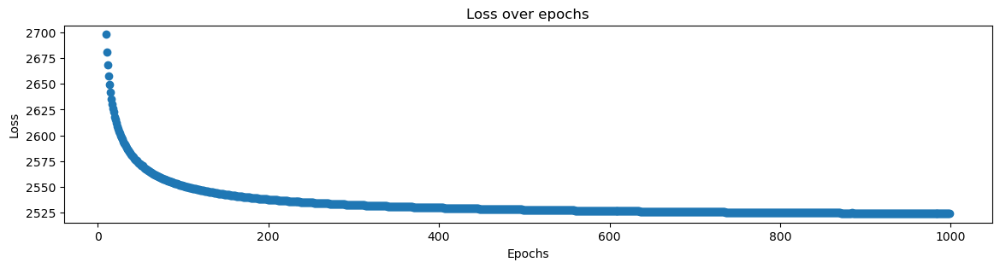

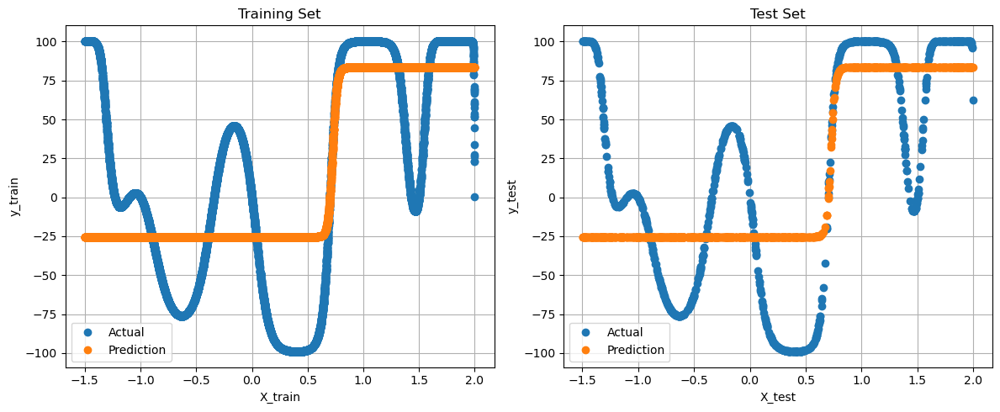

TRAIN MSE = 2524.2491099060
TEST MSE  = 2626.9964009994
TRAINING TIME = 16.85 SECONDS






########################################################################################################################
############################## Training config: activation=sigmoid, layers=1, neurons=15. ##############################


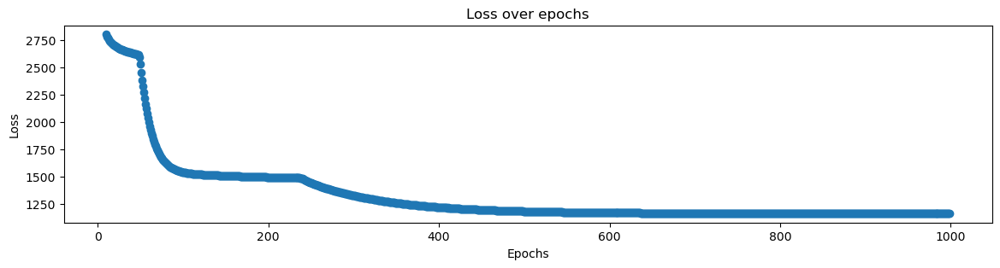

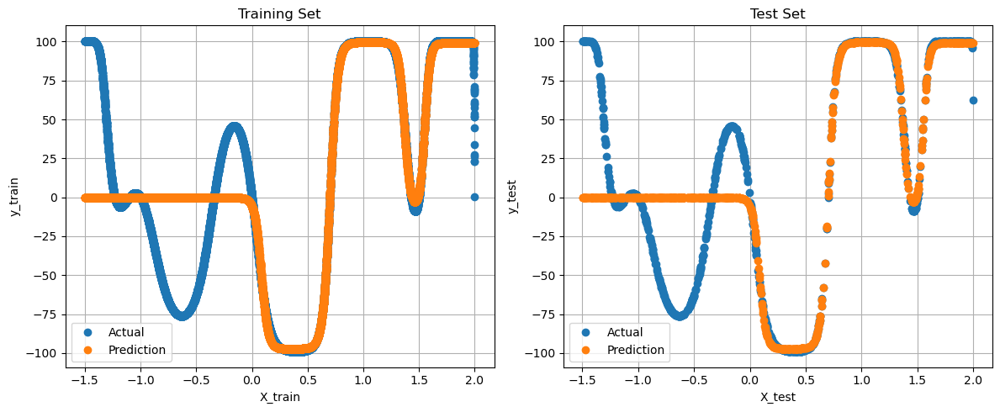

TRAIN MSE = 1162.8614831809
TEST MSE  = 1265.1260096548
TRAINING TIME = 21.83 SECONDS






########################################################################################################################
############################## Training config: activation=sigmoid, layers=1, neurons=30. ##############################


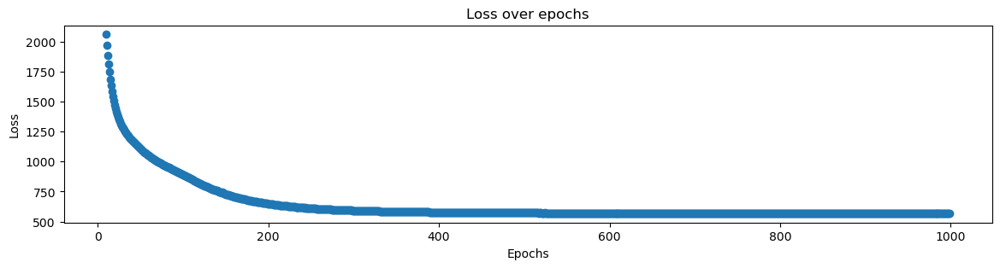

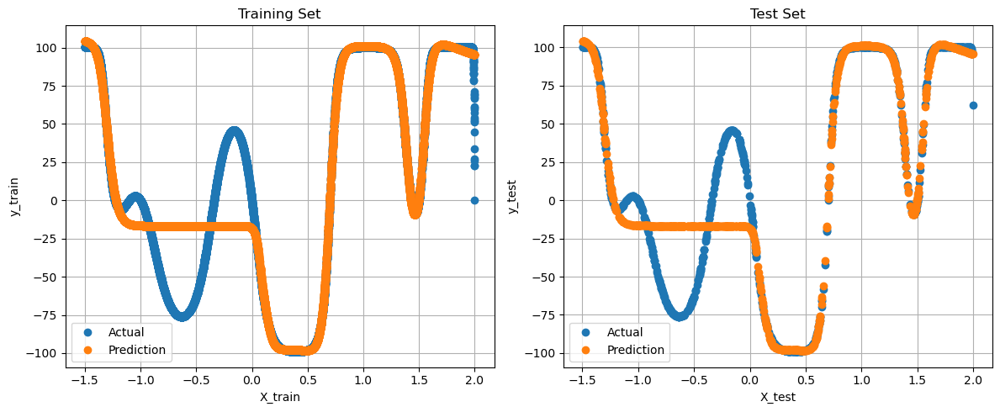

TRAIN MSE = 566.8164926485
TEST MSE  = 591.7992629687
TRAINING TIME = 30.17 SECONDS






########################################################################################################################
############################## Training config: activation=sigmoid, layers=2, neurons=5. ##############################


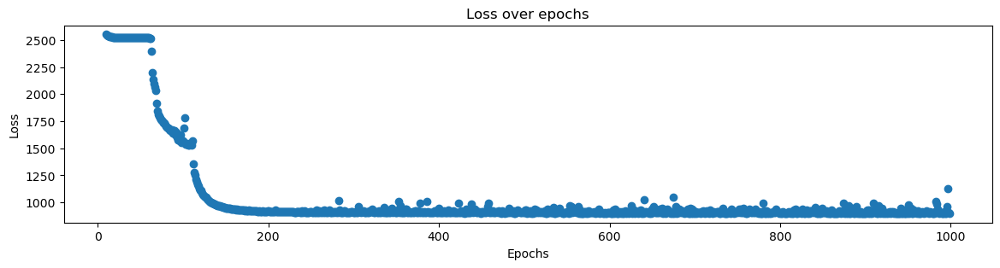

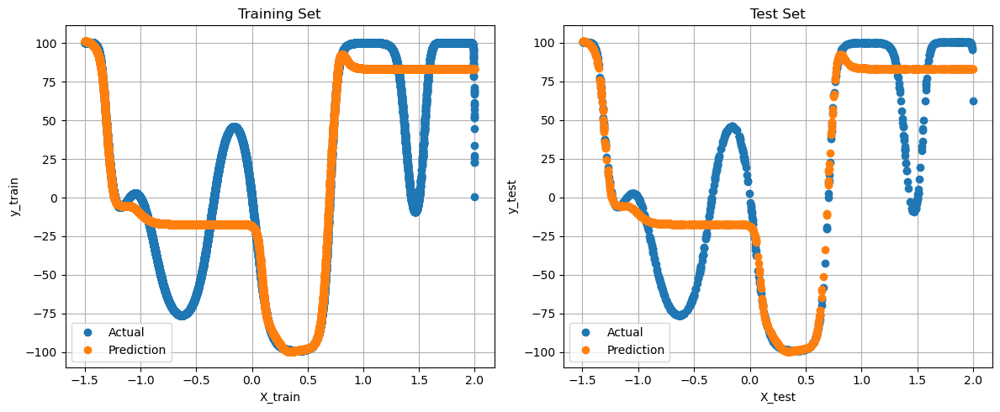

TRAIN MSE = 897.2540923816
TEST MSE  = 969.8620332492
TRAINING TIME = 35.31 SECONDS






########################################################################################################################
############################## Training config: activation=sigmoid, layers=2, neurons=15. ##############################


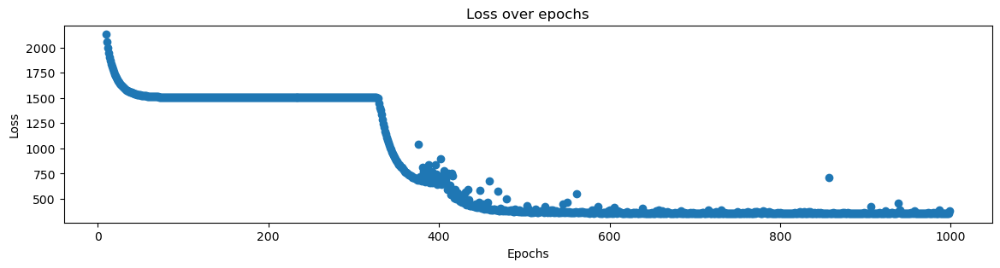

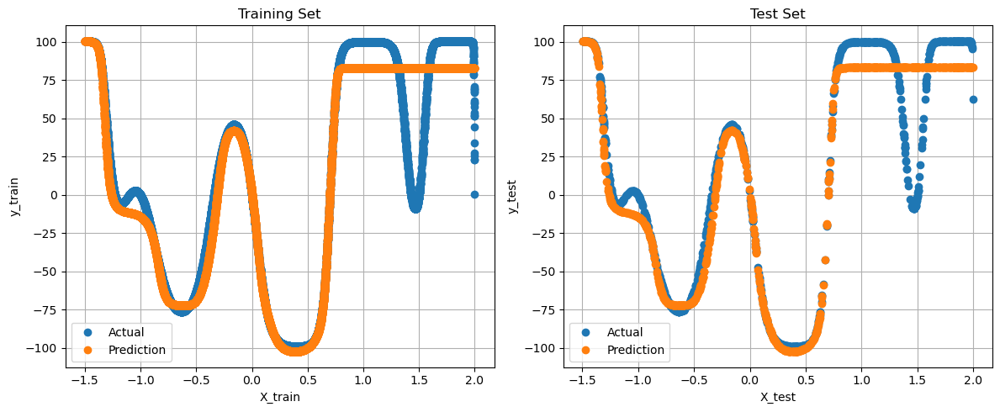

TRAIN MSE = 383.3314194000
TEST MSE  = 427.2207451209
TRAINING TIME = 57.00 SECONDS






########################################################################################################################
############################## Training config: activation=sigmoid, layers=2, neurons=30. ##############################


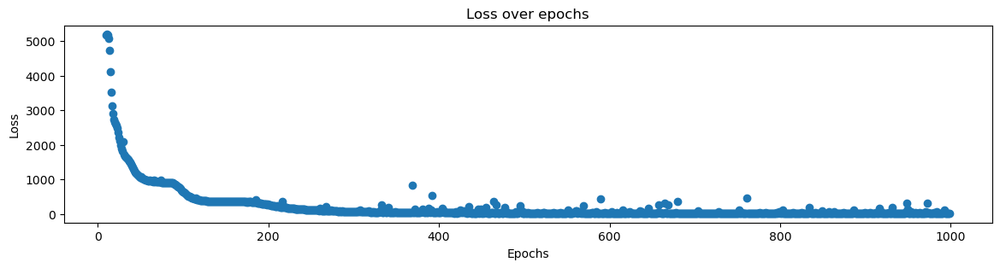

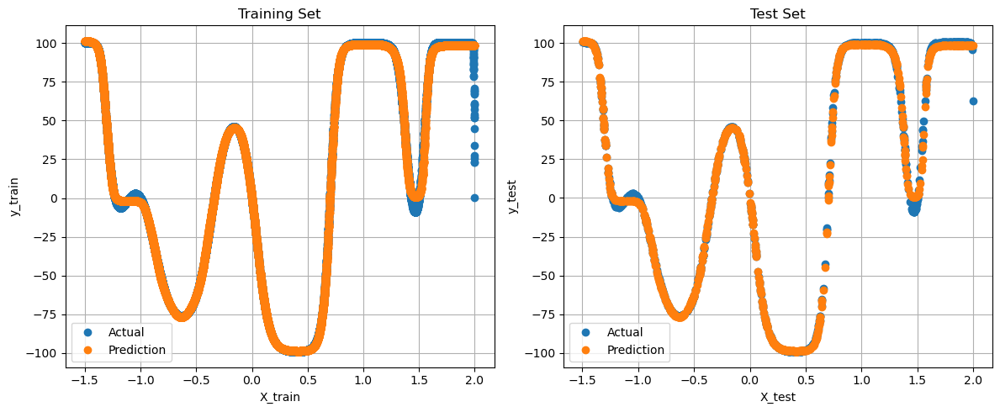

TRAIN MSE = 10.2833149938
TEST MSE  = 5.4282819303
TRAINING TIME = 83.73 SECONDS






########################################################################################################################
############################## Training config: activation=sigmoid, layers=3, neurons=5. ##############################


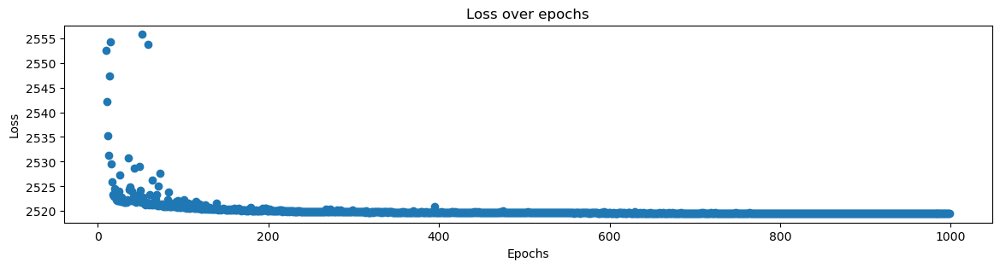

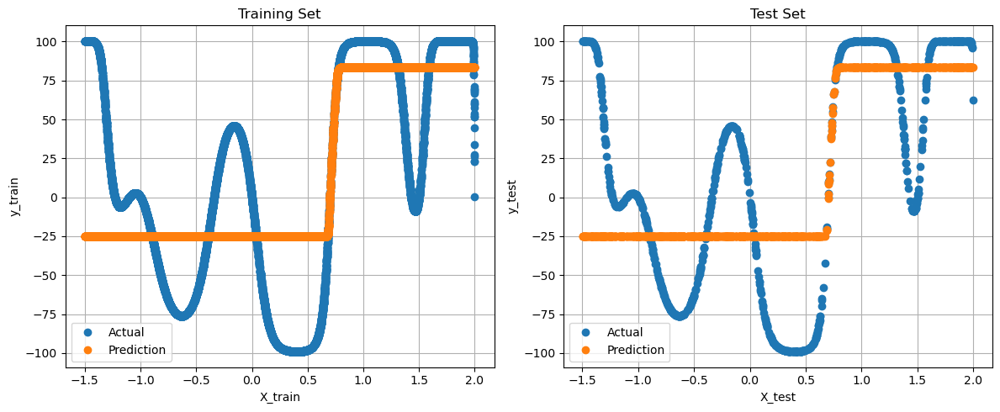

TRAIN MSE = 2519.5290990813
TEST MSE  = 2623.9694651479
TRAINING TIME = 53.41 SECONDS






########################################################################################################################
############################## Training config: activation=sigmoid, layers=3, neurons=15. ##############################


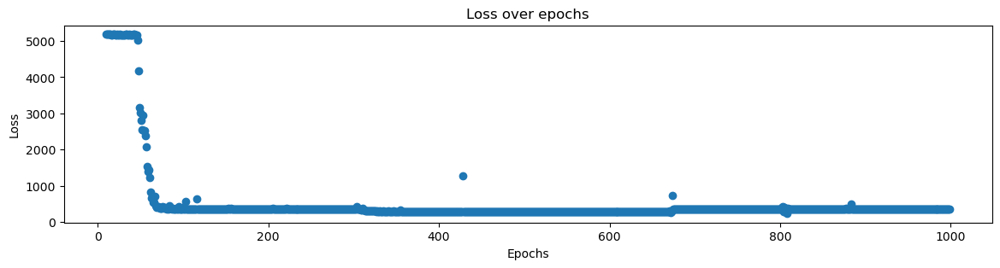

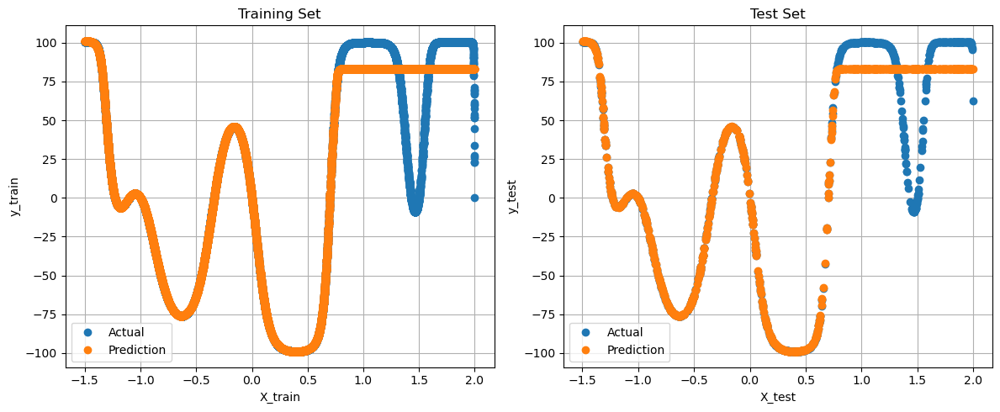

TRAIN MSE = 349.6627825046
TEST MSE  = 391.9771927304
TRAINING TIME = 82.46 SECONDS






########################################################################################################################
############################## Training config: activation=sigmoid, layers=3, neurons=30. ##############################


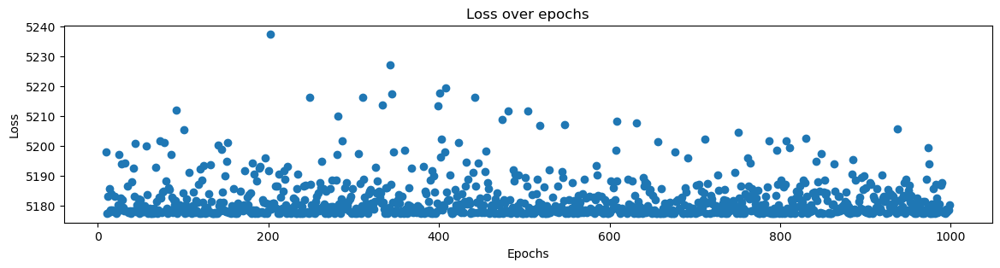

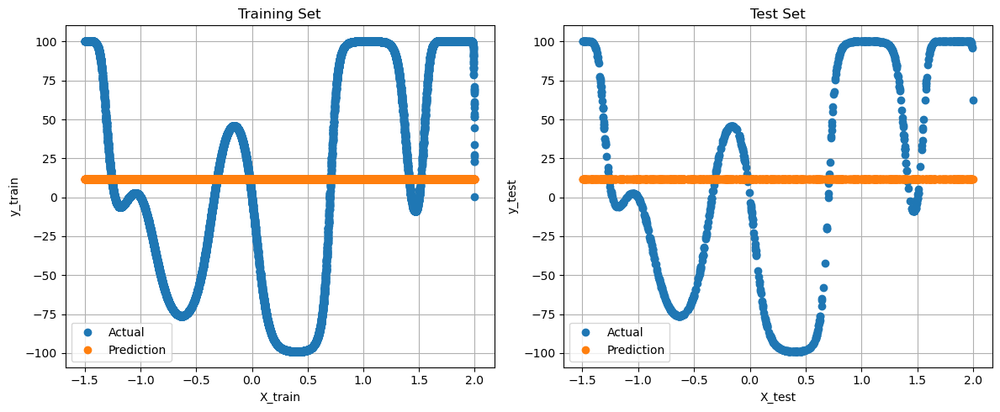

TRAIN MSE = 5180.1813286549
TEST MSE  = 5225.2174678871
TRAINING TIME = 124.91 SECONDS






########################################################################################################################
############################## Training config: activation=linear, layers=1, neurons=5. ##############################


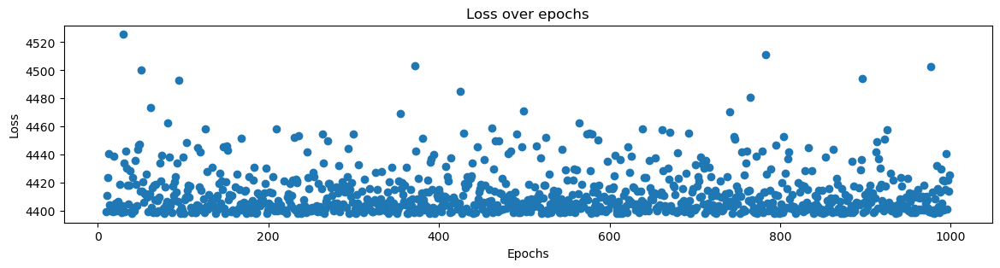

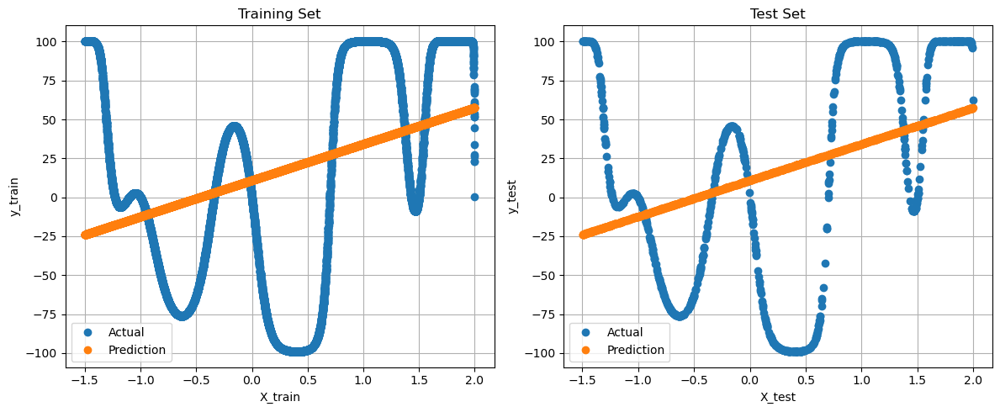

TRAIN MSE = 4425.7445932682
TEST MSE  = 4459.5986556398
TRAINING TIME = 13.70 SECONDS






########################################################################################################################
############################## Training config: activation=linear, layers=1, neurons=15. ##############################


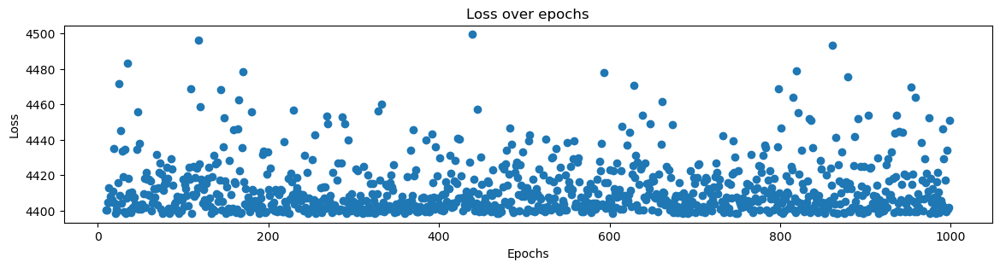

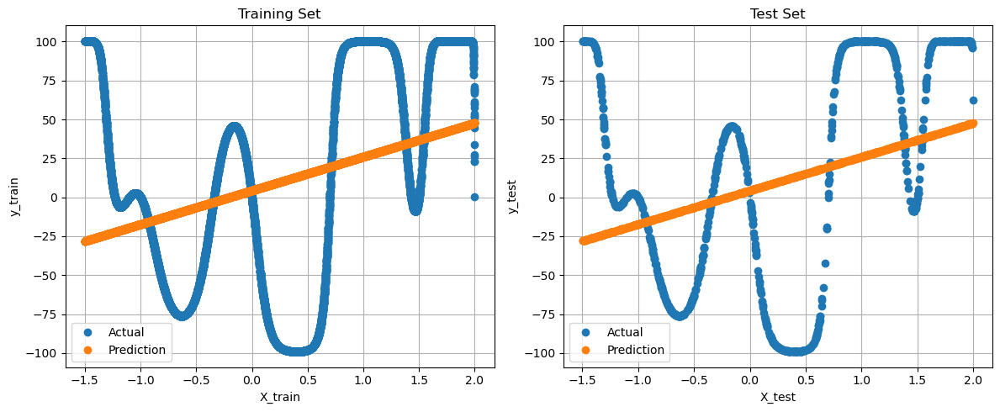

TRAIN MSE = 4450.7511872202
TEST MSE  = 4489.6895654391
TRAINING TIME = 16.06 SECONDS






########################################################################################################################
############################## Training config: activation=linear, layers=1, neurons=30. ##############################


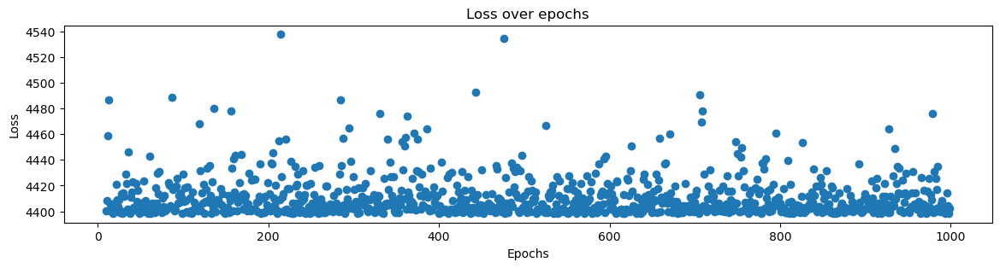

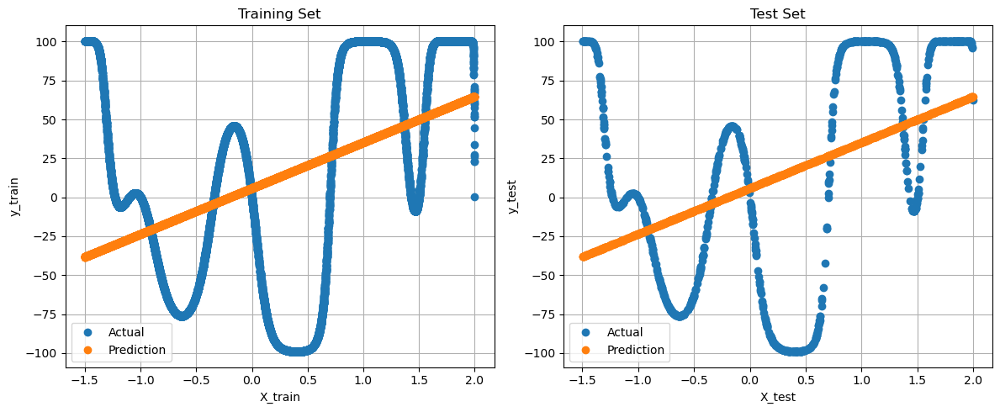

TRAIN MSE = 4402.1739618256
TEST MSE  = 4438.1445521861
TRAINING TIME = 19.16 SECONDS






########################################################################################################################
############################## Training config: activation=linear, layers=2, neurons=5. ##############################


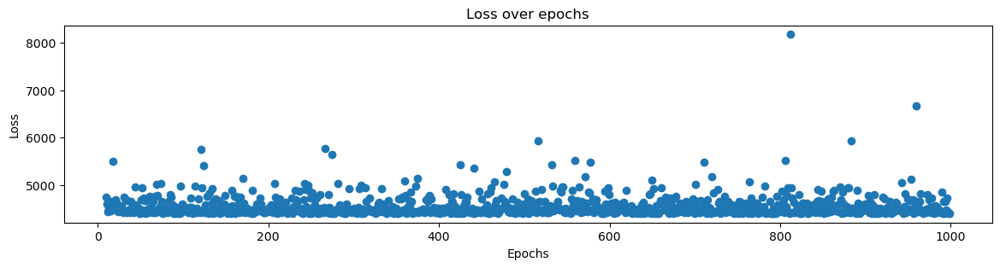

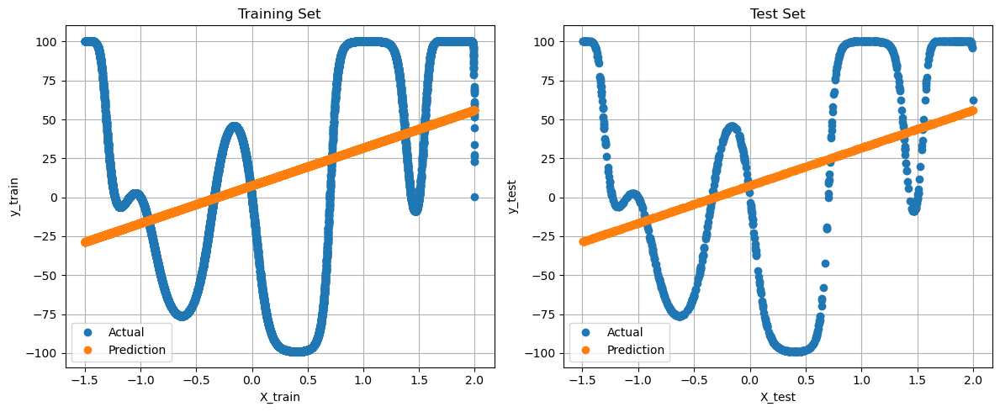

TRAIN MSE = 4410.1968931367
TEST MSE  = 4446.0900134253
TRAINING TIME = 31.76 SECONDS






########################################################################################################################
############################## Training config: activation=linear, layers=2, neurons=15. ##############################


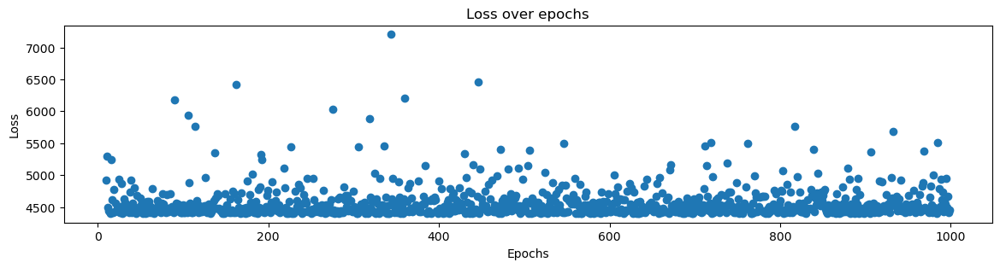

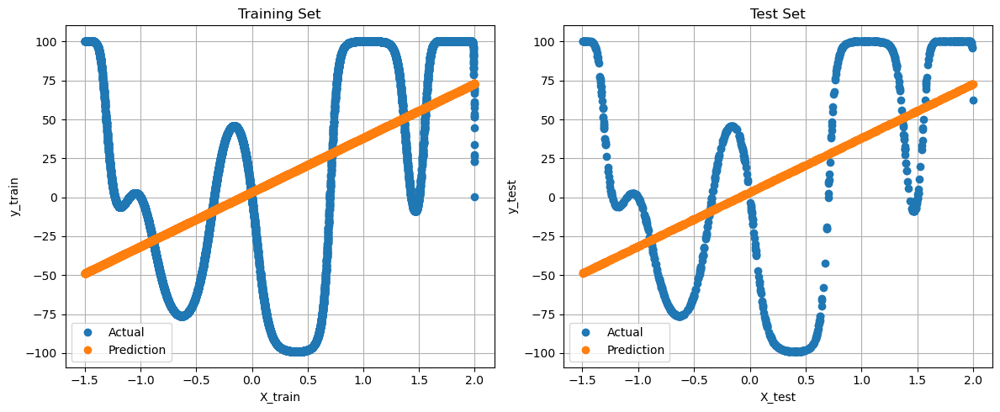

TRAIN MSE = 4455.1487749338
TEST MSE  = 4492.2950644703
TRAINING TIME = 41.42 SECONDS






########################################################################################################################
############################## Training config: activation=linear, layers=2, neurons=30. ##############################


C:\Users\flang\AppData\Local\Temp\ipykernel_3276\1748688595.py:183: RuntimeWarning: overflow encountered in matmul
  error = deltas[-1] @ next_layer.weights.T
C:\Users\flang\AppData\Local\Temp\ipykernel_3276\1748688595.py:188: RuntimeWarning: invalid value encountered in matmul
  weight_gradients = [(activations[i].T @ deltas[i]) / batch_size for i in range(len(self.layers))]
C:\Users\flang\AppData\Local\Temp\ipykernel_3276\1748688595.py:188: RuntimeWarning: overflow encountered in matmul
  weight_gradients = [(activations[i].T @ deltas[i]) / batch_size for i in range(len(self.layers))]
c:\Users\flang\anaconda3\envs\miowad\Lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


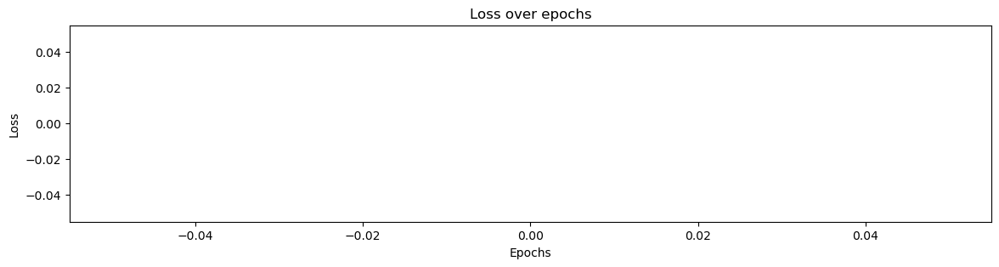

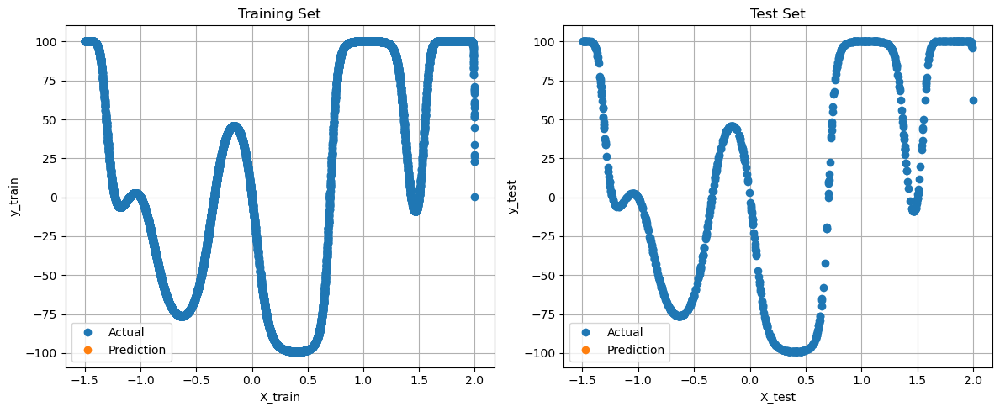

TRAIN MSE = nan
TEST MSE  = nan
TRAINING TIME = 49.08 SECONDS






########################################################################################################################
############################## Training config: activation=linear, layers=3, neurons=5. ##############################


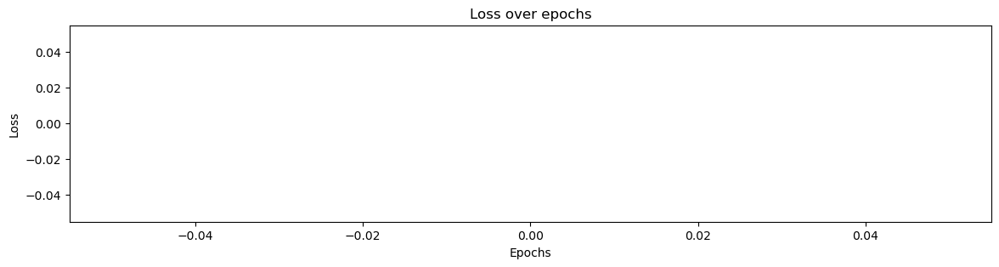

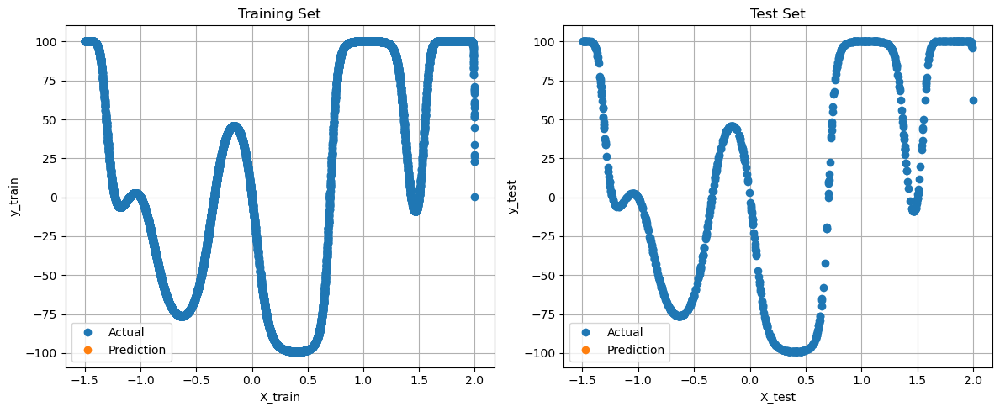

TRAIN MSE = nan
TEST MSE  = nan
TRAINING TIME = 43.77 SECONDS






########################################################################################################################
############################## Training config: activation=linear, layers=3, neurons=15. ##############################


C:\Users\flang\AppData\Local\Temp\ipykernel_3276\1748688595.py:183: RuntimeWarning: invalid value encountered in matmul
  error = deltas[-1] @ next_layer.weights.T


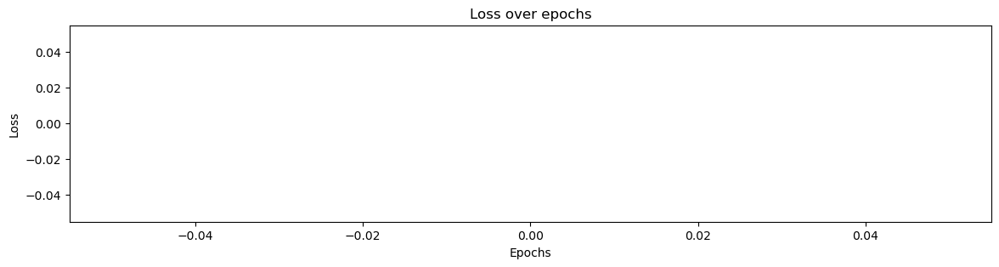

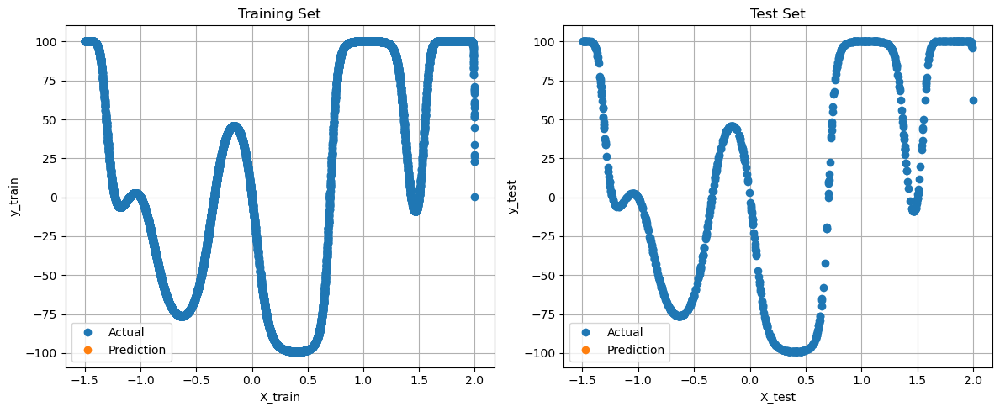

TRAIN MSE = nan
TEST MSE  = nan
TRAINING TIME = 55.32 SECONDS






########################################################################################################################
############################## Training config: activation=linear, layers=3, neurons=30. ##############################


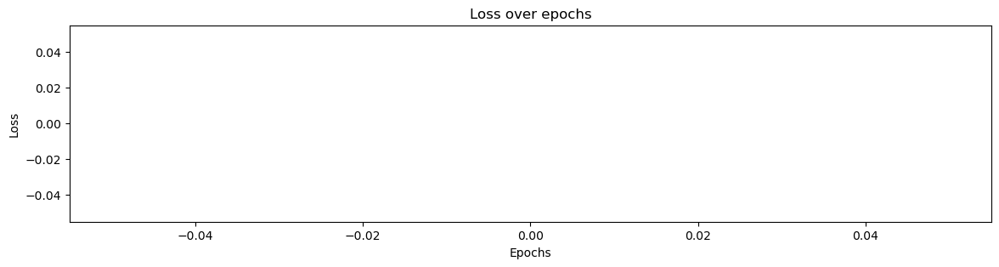

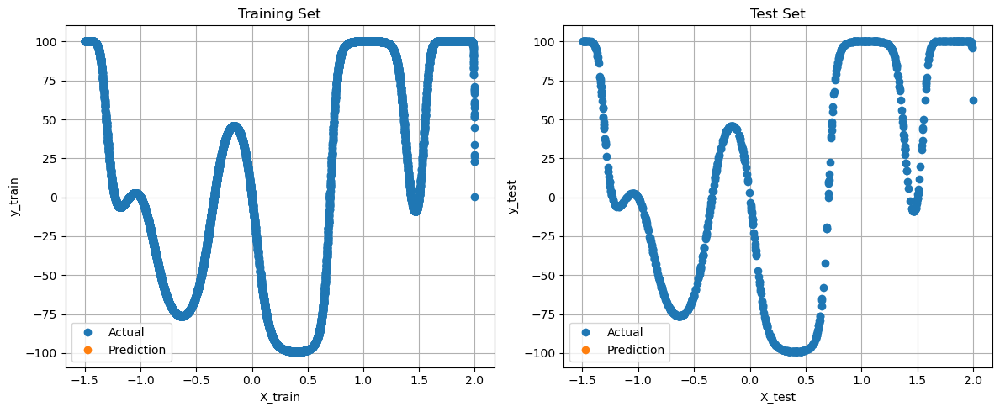

TRAIN MSE = nan
TEST MSE  = nan
TRAINING TIME = 72.76 SECONDS






########################################################################################################################
############################## Training config: activation=tanh, layers=1, neurons=5. ##############################


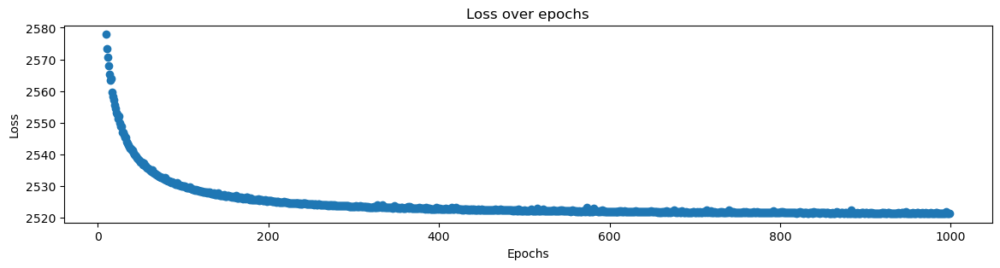

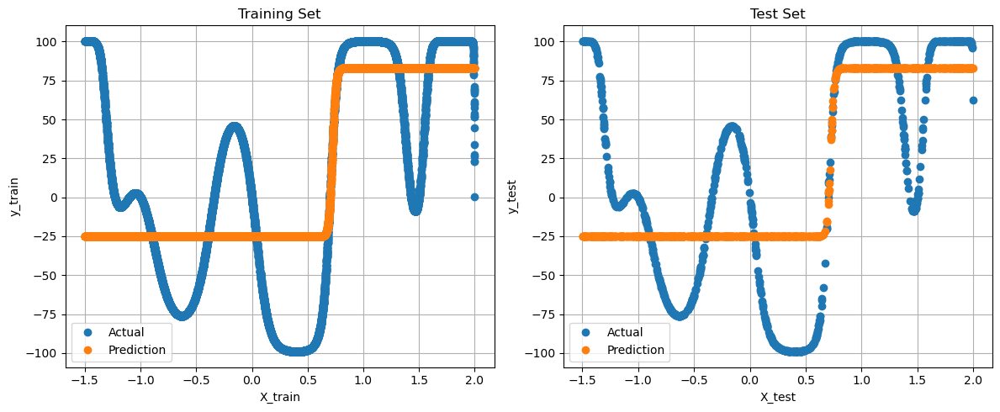

TRAIN MSE = 2521.2706882696
TEST MSE  = 2624.6958375904
TRAINING TIME = 16.43 SECONDS






########################################################################################################################
############################## Training config: activation=tanh, layers=1, neurons=15. ##############################


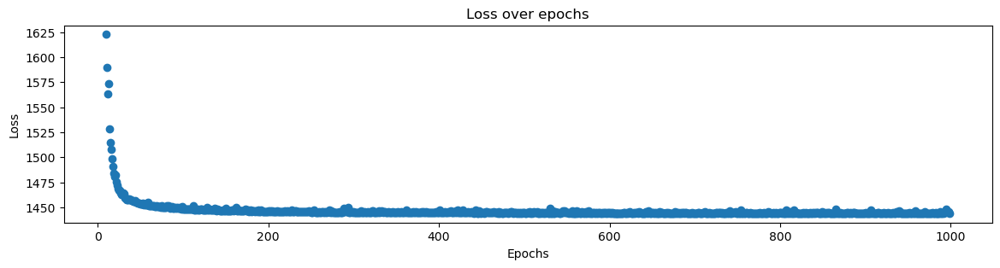

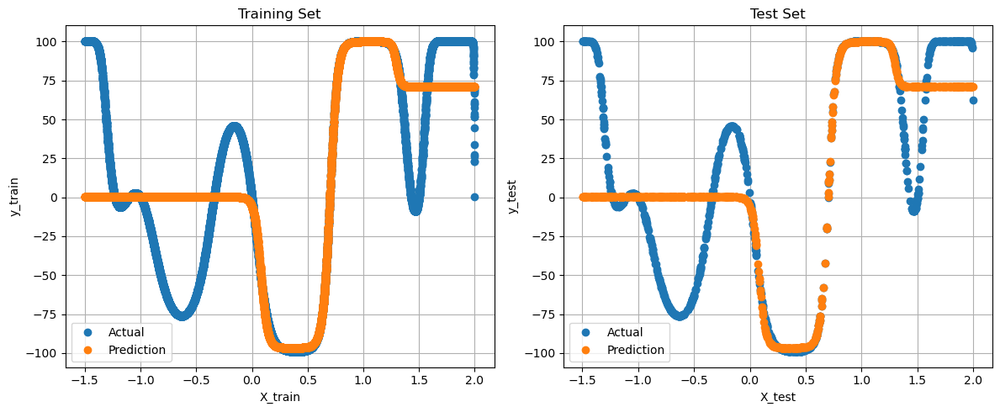

TRAIN MSE = 1444.0571241640
TEST MSE  = 1583.4116764084
TRAINING TIME = 25.14 SECONDS






########################################################################################################################
############################## Training config: activation=tanh, layers=1, neurons=30. ##############################


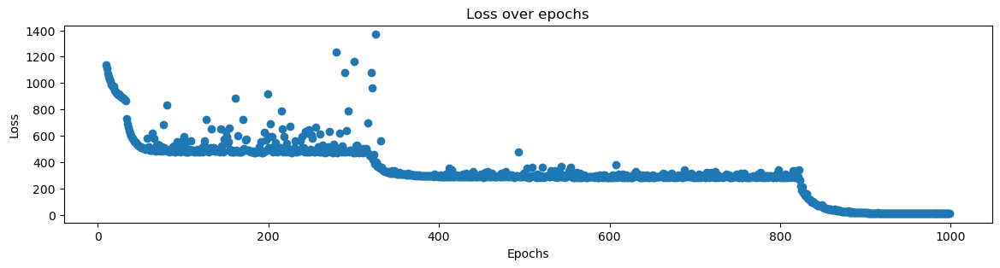

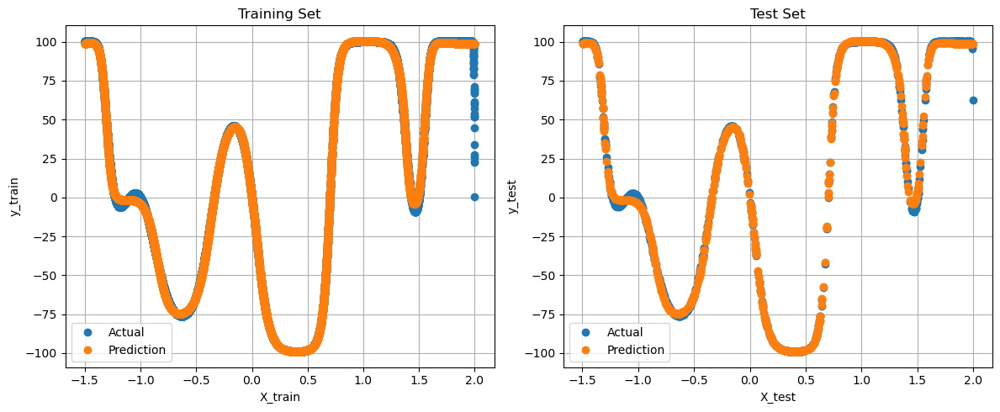

TRAIN MSE = 8.7729024893
TEST MSE  = 3.9785157974
TRAINING TIME = 33.68 SECONDS






########################################################################################################################
############################## Training config: activation=tanh, layers=2, neurons=5. ##############################


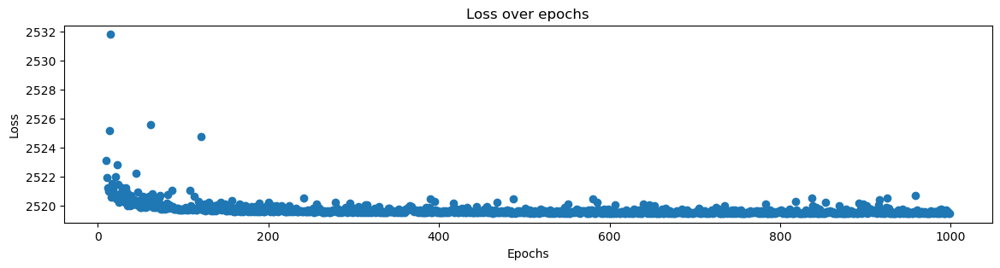

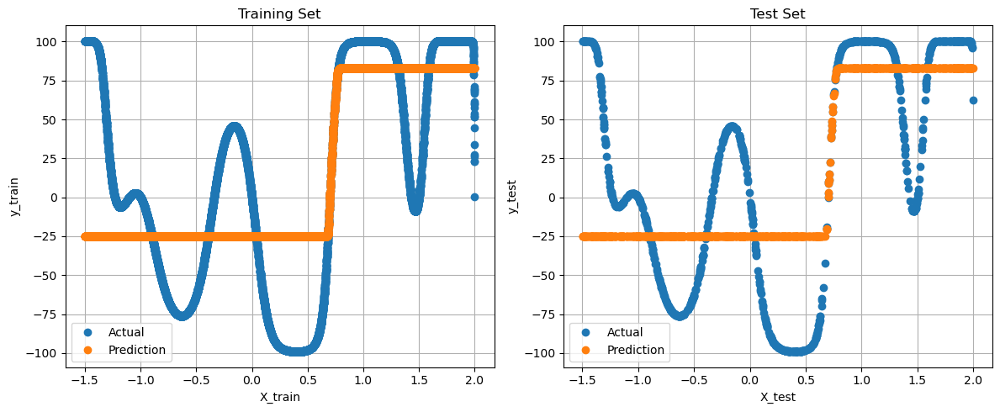

TRAIN MSE = 2519.4741097130
TEST MSE  = 2623.5453287062
TRAINING TIME = 39.52 SECONDS






########################################################################################################################
############################## Training config: activation=tanh, layers=2, neurons=15. ##############################


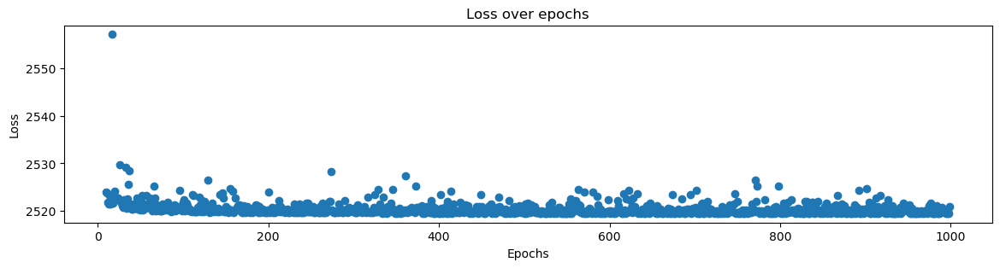

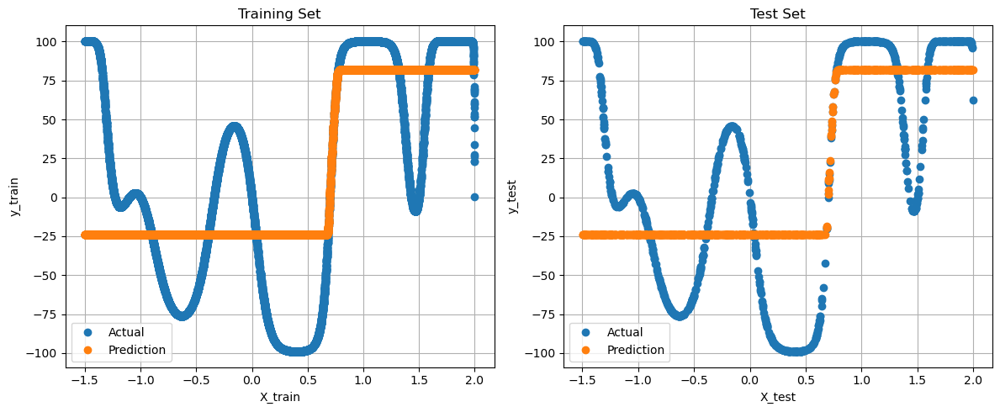

TRAIN MSE = 2520.9421356077
TEST MSE  = 2623.7528094489
TRAINING TIME = 64.76 SECONDS






########################################################################################################################
############################## Training config: activation=tanh, layers=2, neurons=30. ##############################


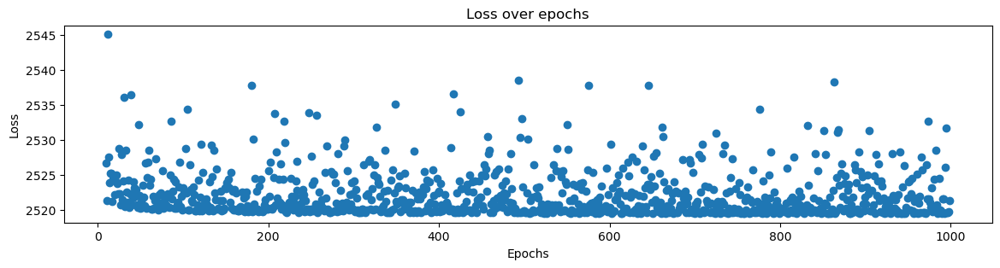

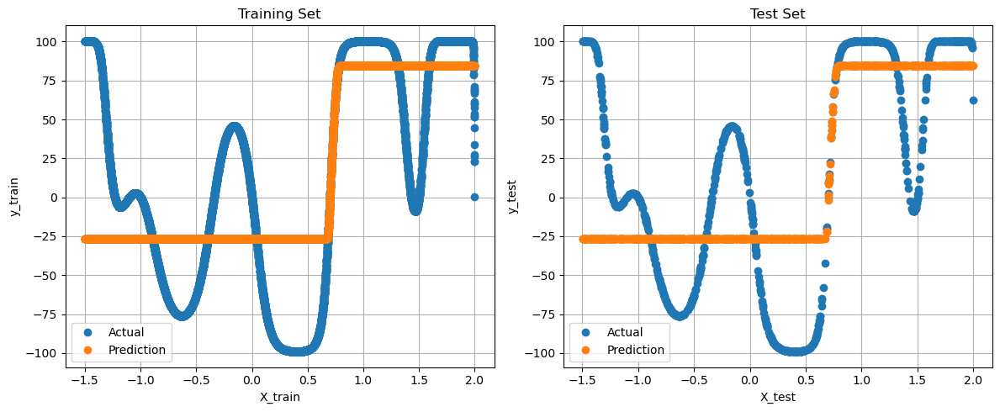

TRAIN MSE = 2521.3771873760
TEST MSE  = 2627.4164719268
TRAINING TIME = 104.06 SECONDS






########################################################################################################################
############################## Training config: activation=tanh, layers=3, neurons=5. ##############################


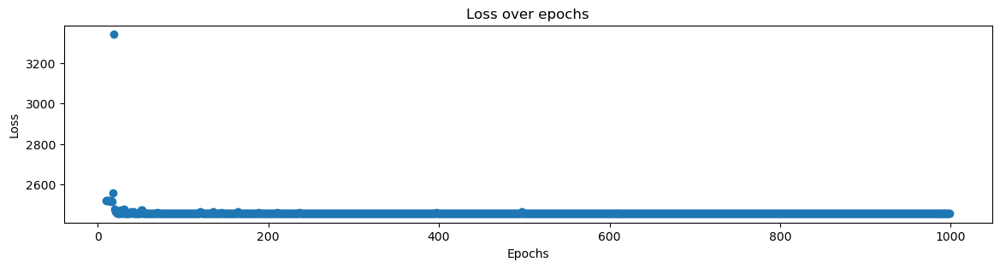

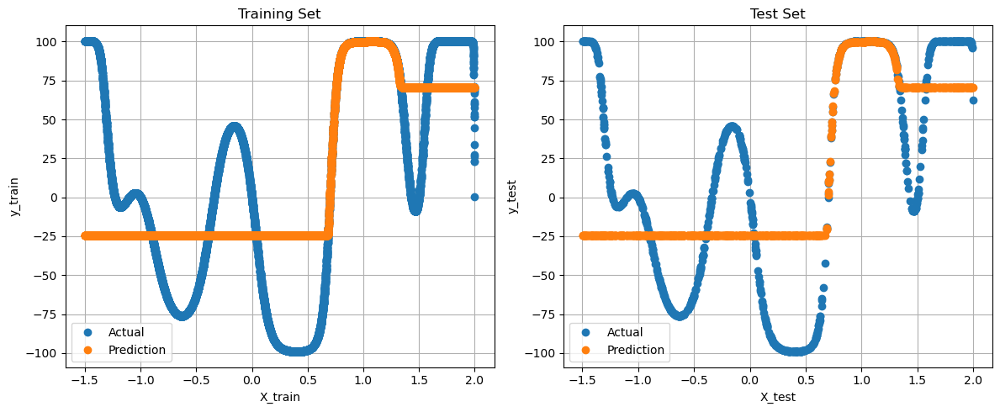

TRAIN MSE = 2457.8097518886
TEST MSE  = 2551.5235777906
TRAINING TIME = 55.67 SECONDS






########################################################################################################################
############################## Training config: activation=tanh, layers=3, neurons=15. ##############################


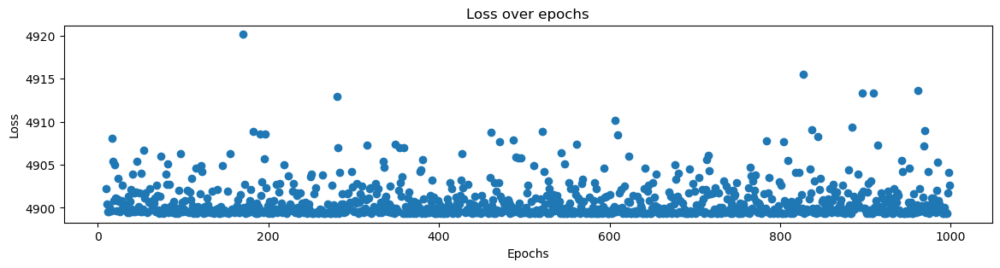

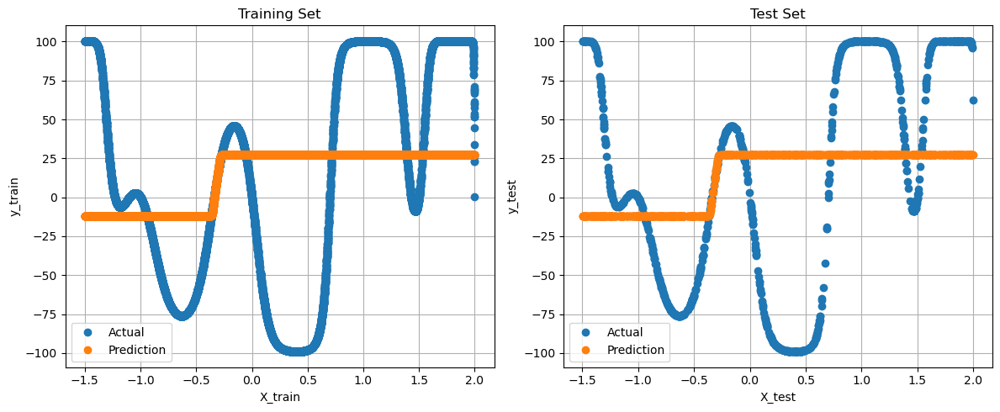

TRAIN MSE = 4902.6177523623
TEST MSE  = 4913.0371957412
TRAINING TIME = 99.14 SECONDS






########################################################################################################################
############################## Training config: activation=tanh, layers=3, neurons=30. ##############################


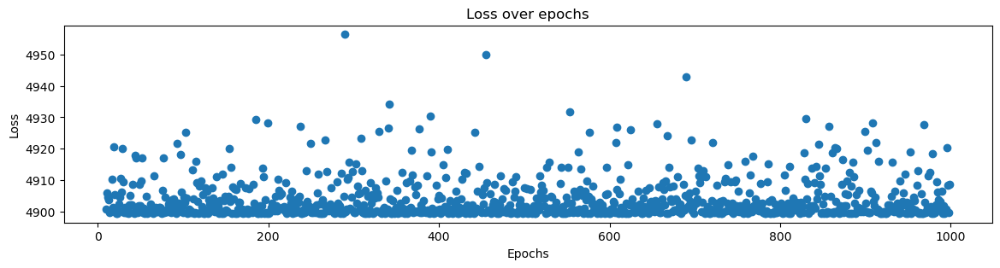

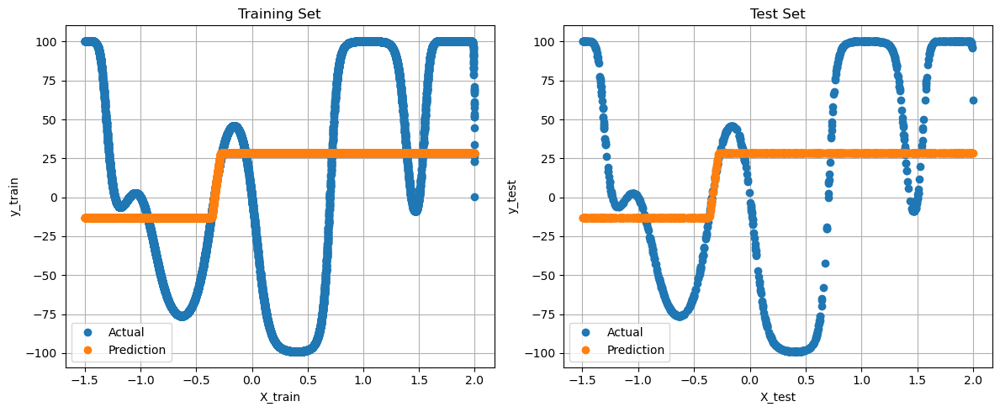

TRAIN MSE = 4908.7384484248
TEST MSE  = 4916.6089739264
TRAINING TIME = 150.15 SECONDS






########################################################################################################################
############################## Training config: activation=relu, layers=1, neurons=5. ##############################


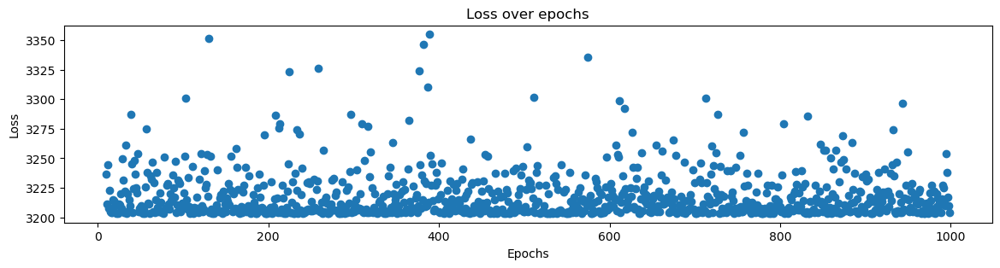

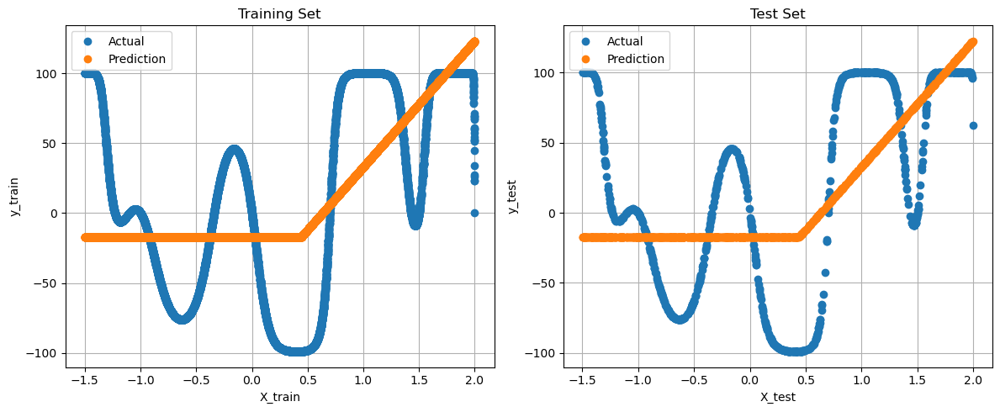

TRAIN MSE = 3203.7676238784
TEST MSE  = 3260.1157553909
TRAINING TIME = 20.91 SECONDS






########################################################################################################################
############################## Training config: activation=relu, layers=1, neurons=15. ##############################


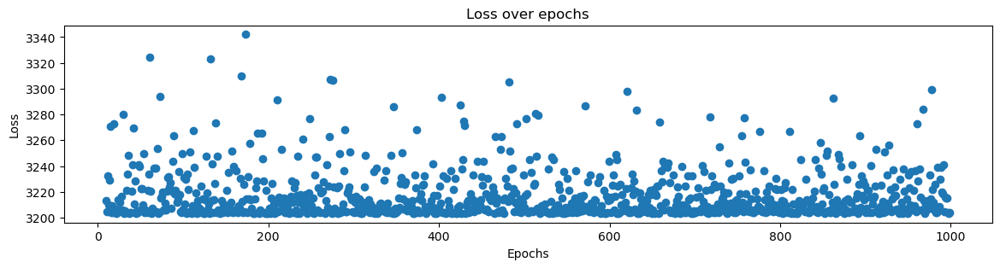

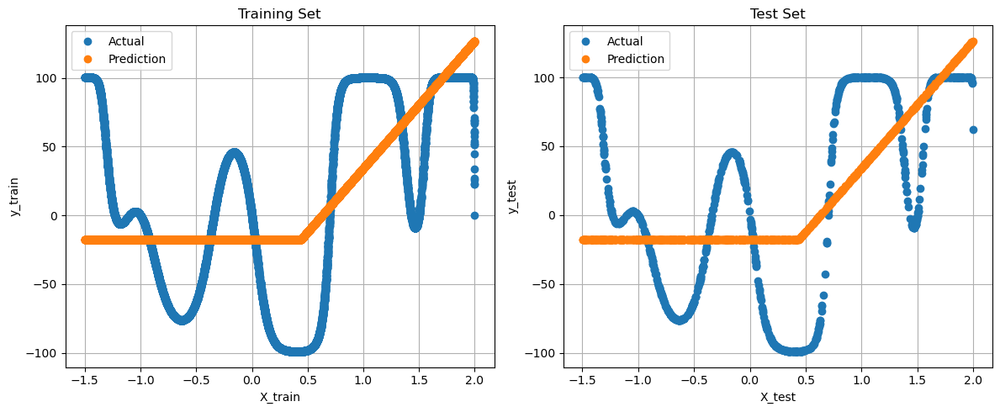

TRAIN MSE = 3203.7545692881
TEST MSE  = 3261.5652030644
TRAINING TIME = 24.61 SECONDS






########################################################################################################################
############################## Training config: activation=relu, layers=1, neurons=30. ##############################


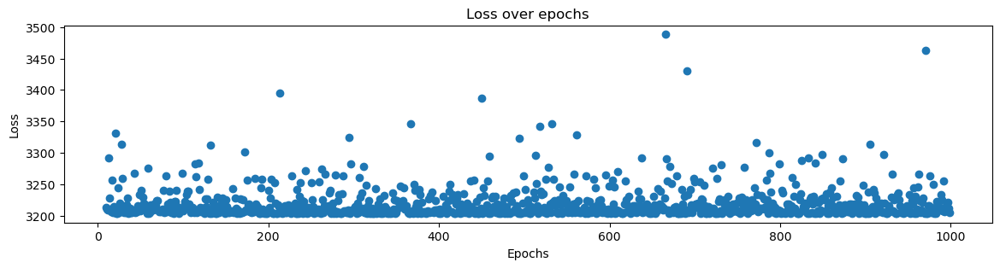

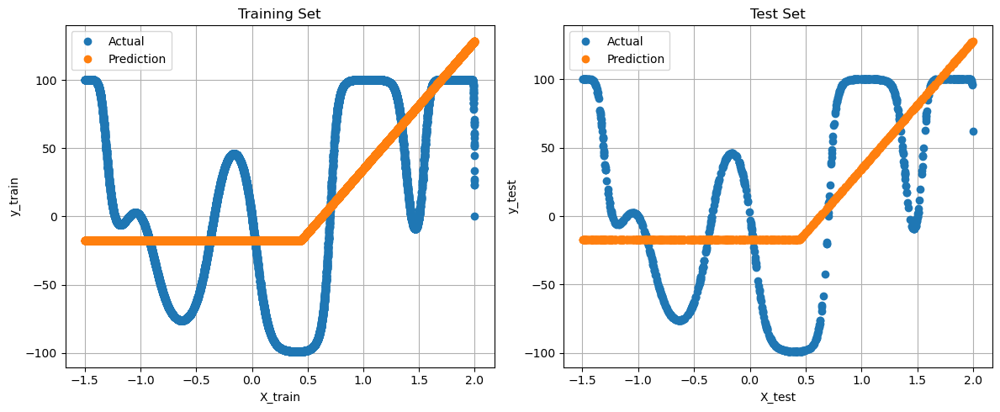

TRAIN MSE = 3204.9487237162
TEST MSE  = 3263.8422166215
TRAINING TIME = 28.64 SECONDS






########################################################################################################################
############################## Training config: activation=relu, layers=2, neurons=5. ##############################


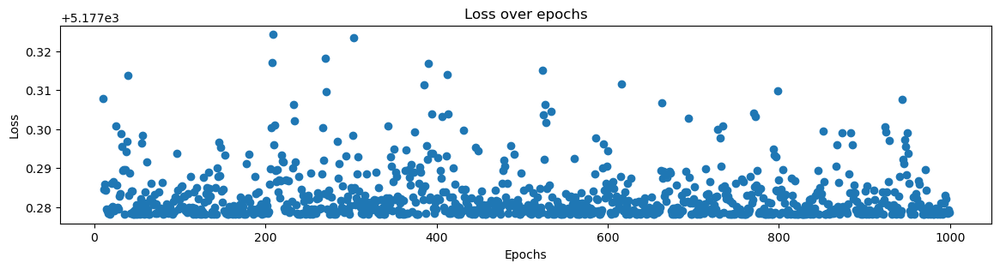

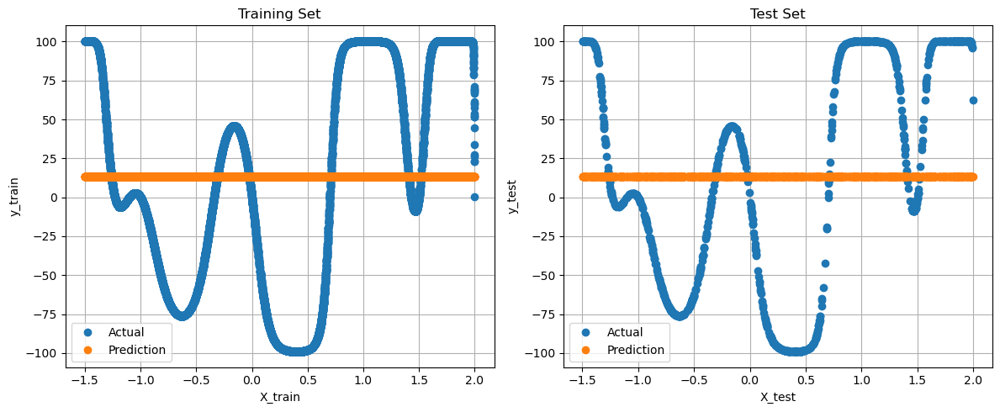

TRAIN MSE = 5177.2785487501
TEST MSE  = 5221.3857941346
TRAINING TIME = 37.87 SECONDS






########################################################################################################################
############################## Training config: activation=relu, layers=2, neurons=15. ##############################


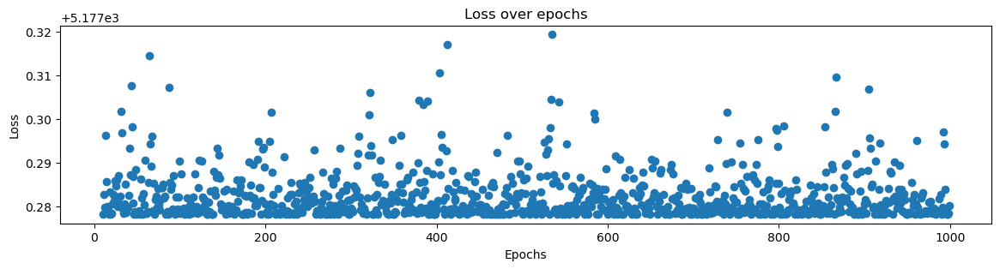

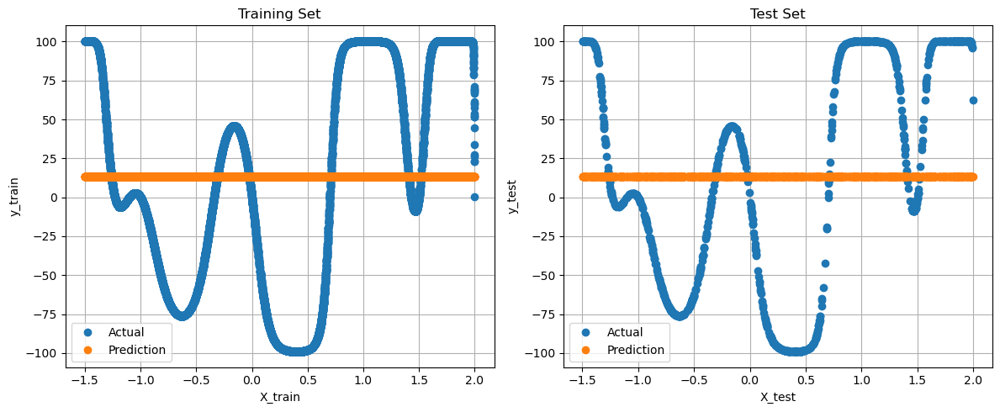

TRAIN MSE = 5177.2802441840
TEST MSE  = 5221.3735526765
TRAINING TIME = 50.24 SECONDS






########################################################################################################################
############################## Training config: activation=relu, layers=2, neurons=30. ##############################


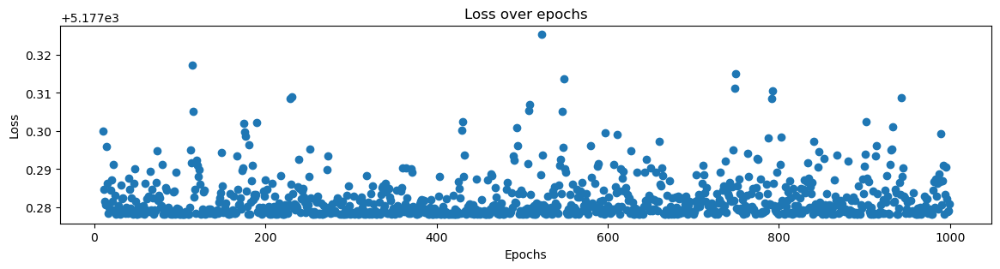

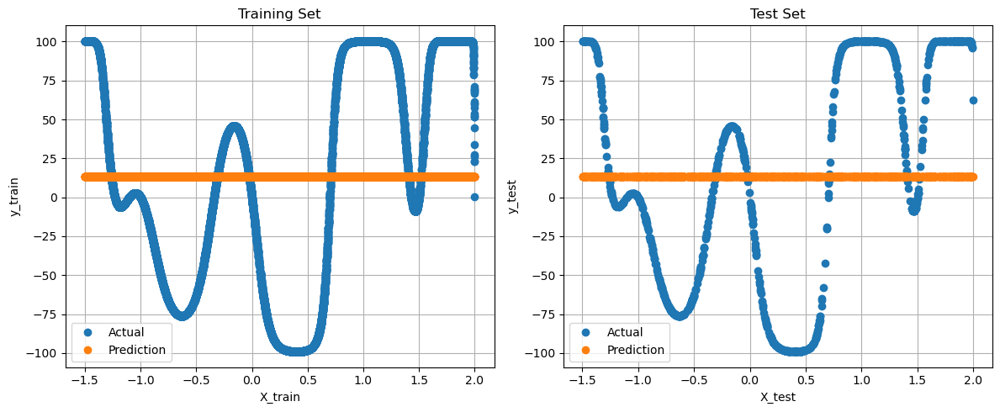

TRAIN MSE = 5177.2809539722
TEST MSE  = 5221.3703838123
TRAINING TIME = 67.94 SECONDS






########################################################################################################################
############################## Training config: activation=relu, layers=3, neurons=5. ##############################


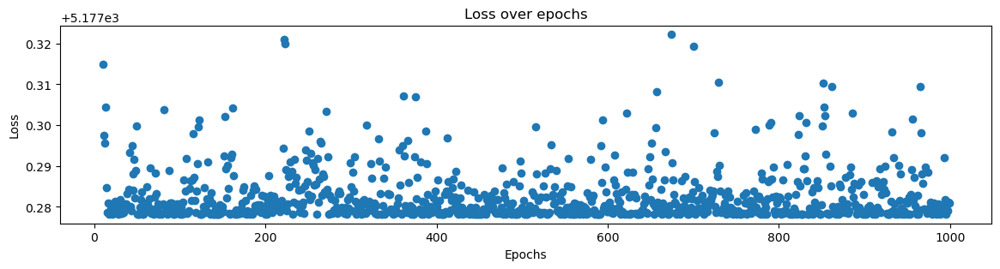

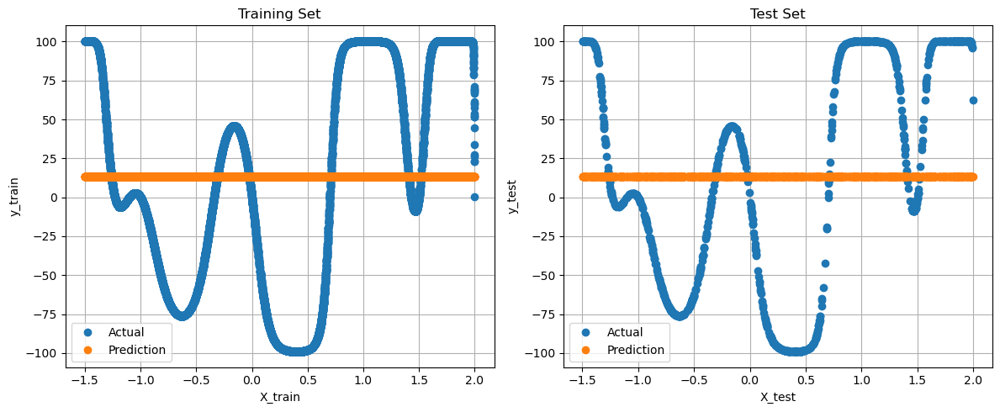

TRAIN MSE = 5177.2809627924
TEST MSE  = 5221.3703477480
TRAINING TIME = 54.89 SECONDS






########################################################################################################################
############################## Training config: activation=relu, layers=3, neurons=15. ##############################


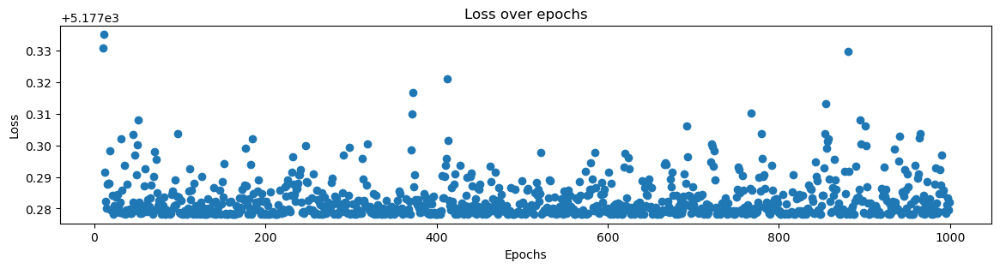

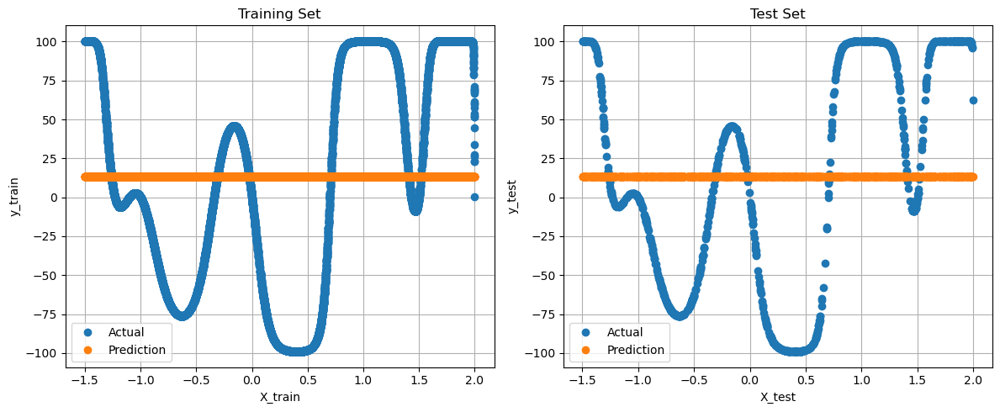

TRAIN MSE = 5177.2819343673
TEST MSE  = 5221.3667453621
TRAINING TIME = 65.77 SECONDS






########################################################################################################################
############################## Training config: activation=relu, layers=3, neurons=30. ##############################


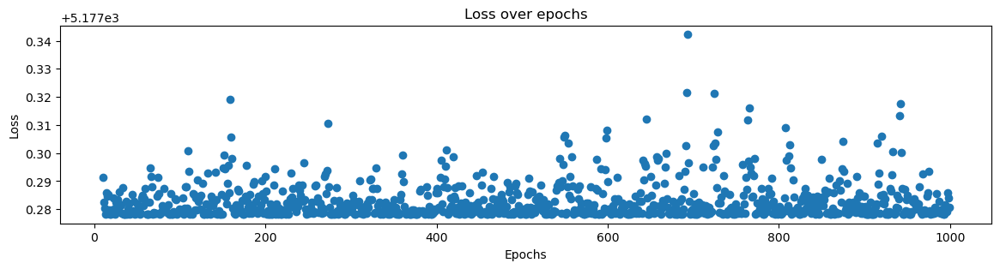

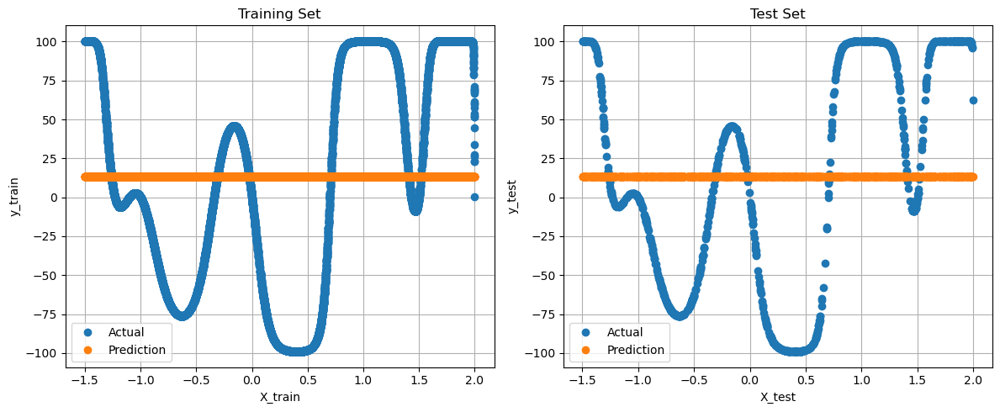

TRAIN MSE = 5177.2806643227
TEST MSE  = 5221.3716095692
TRAINING TIME = 81.65 SECONDS








In [42]:
np.random.seed(23)

multimodal_large_train = pd.read_csv('./data/regression/multimodal-large-training.csv')
X_train = np.array(multimodal_large_train['x']).reshape(-1, 1)
y_train = np.array(multimodal_large_train['y'])

multimodal_large_test = pd.read_csv('./data/regression/multimodal-large-test.csv')
X_test = np.array(multimodal_large_test['x']).reshape(-1, 1)
y_test = np.array(multimodal_large_test['y'])

activations = ['sigmoid', 'linear', 'tanh', 'relu']
neurons = [5, 15, 30]
layers_number = [1, 2, 3]

global_train_mse = []
global_test_mse = []
global_train_time = []

for activation in activations:
    for num_layers in layers_number:
        for neuron_count in neurons:
            print("#" * 120)
            print(f"############################## Training config: activation={activation}, layers={num_layers}, neurons={neuron_count}. ##############################")

            layers = []

            layers.append({
                'input_dim': 1,
                'output_dim': neuron_count,
                'activation': activation
            })

            for _ in range(1, num_layers):
                layers.append({
                    'input_dim': neuron_count,
                    'output_dim': neuron_count,
                    'activation': activation
                })

            layers.append({
                'input_dim': neuron_count,
                'output_dim': 1,
                'activation': 'linear'
            })

            NN = MLP(
                layers=layers,
                weights_init='uniform',
                classification=False
            )
            
            
            start_time = time.time()
            NN.train(X_train, y_train, epochs=1000, learning_rate=0.005, batch_size=120)
            end_time = time.time()
            training_time = end_time - start_time
            global_train_time.append(training_time)

            y_train_pred = NN.predict(X_train)
            y_test_pred = NN.predict(X_test)

            train_mse = NN.mse(y_train_pred, y_train)
            test_mse = NN.mse(y_test_pred, y_test)
            create_plots(X_train, y_train, X_test, y_test, y_train_pred, y_test_pred)
            print(f"TRAIN MSE = {train_mse:.10f}")
            print(f"TEST MSE  = {test_mse:.10f}")
            print(f"TRAINING TIME = {training_time:.2f} SECONDS")
            global_train_mse.append(train_mse)
            global_test_mse.append(test_mse)
            
            print('\n' * 5)
            
            

In [44]:
configs = []
for activation in activations:
    for num_layers in layers_number:
        for neuron_count in neurons:
            config = {
                'activation': activation,
                'num_layers': num_layers,
                'neurons_per_layer': neuron_count
            }
            configs.append(config)

assert len(configs) == len(global_train_mse) == len(global_test_mse) == len(global_train_time)

df_results = pd.DataFrame(configs)
df_results['train_mse'] = global_train_mse
df_results['test_mse'] = global_test_mse
df_results['training_time_sec'] = global_train_time

df_results

,activation,num_layers,neurons_per_layer,train_mse,test_mse,training_time_sec
0,sigmoid,1,5,2524.249110,2626.996401,16.845202
1,sigmoid,1,15,1162.861483,1265.126010,21.825994
2,sigmoid,1,30,566.816493,591.799263,30.167560
3,sigmoid,2,5,897.254092,969.862033,35.305981
4,sigmoid,2,15,383.331419,427.220745,57.004890
5,sigmoid,2,30,10.283315,5.428282,83.730977
6,sigmoid,3,5,2519.529099,2623.969465,53.408611
7,sigmoid,3,15,349.662783,391.977193,82.463686
8,sigmoid,3,30,5180.181329,5225.217468,124.910506
9,linear,1,5,4425.744593,4459.598656,13.704790


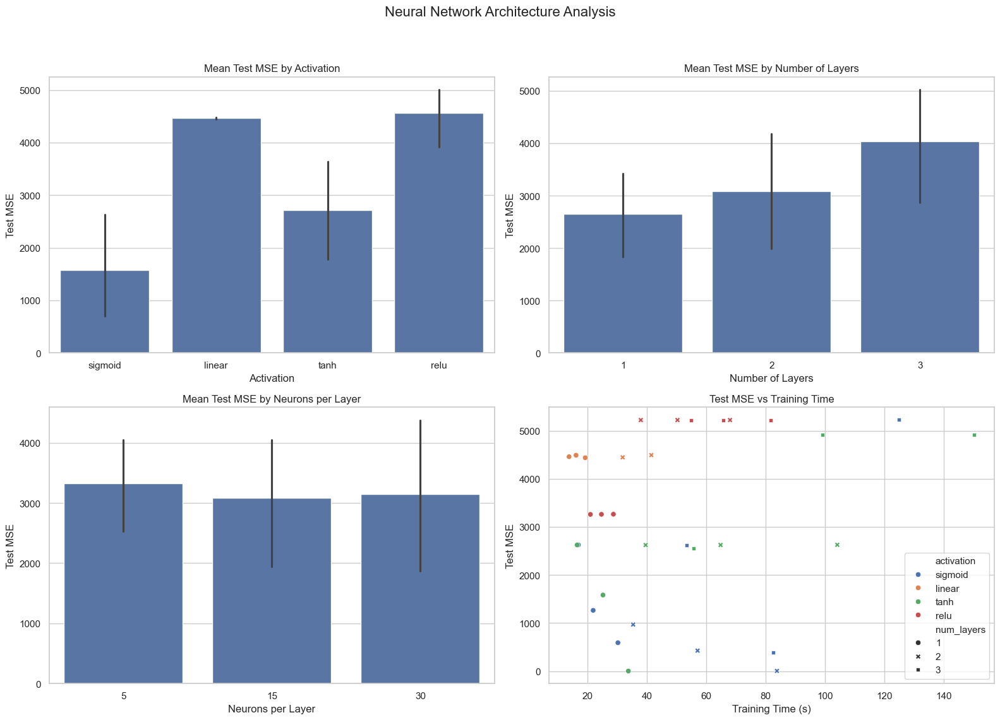

In [ ]:
df = df_results.copy() 

fig, axs = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Neural Network Architecture Analysis", fontsize=16)

sns.barplot(data=df, x='activation', y='test_mse', estimator=np.mean, ax=axs[0, 0])
axs[0, 0].set_title("Mean Test MSE by Activation")
axs[0, 0].set_xlabel("Activation")
axs[0, 0].set_ylabel("Test MSE")

sns.barplot(data=df, x='num_layers', y='test_mse', estimator=np.mean, ax=axs[0, 1])
axs[0, 1].set_title("Mean Test MSE by Number of Layers")
axs[0, 1].set_xlabel("Number of Layers")
axs[0, 1].set_ylabel("Test MSE")

sns.barplot(data=df, x='neurons_per_layer', y='test_mse', estimator=np.mean, ax=axs[1, 0])
axs[1, 0].set_title("Mean Test MSE by Neurons per Layer")
axs[1, 0].set_xlabel("Neurons per Layer")
axs[1, 0].set_ylabel("Test MSE")

sns.scatterplot(data=df, x='training_time_sec', y='test_mse', hue='activation', style='num_layers', ax=axs[1, 1])
axs[1, 1].set_title("Test MSE vs Training Time")
axs[1, 1].set_xlabel("Training Time (s)")
axs[1, 1].set_ylabel("Test MSE")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Based on the data, the following conclusions can be drawn:

Best qualitative results are obtained with the model using the tanh activation, one layer, and 30 neurons. This configuration achieves the lowest test error (MSE of approximately 3.98) along with a very low training error (MSE of about 8.77).

Fastest training time is observed with the model using the sigmoid activation, one layer, and 5 neurons, which trains in roughly 13.70 seconds.

Worst performance is mainly seen with models using the relu activation. These models, especially when using two or three layers, exhibit very high errors (both training and test errors in the range of approximately 5177–5221) and longer training times.

Additionally, increasing the number of layers does not necessarily lead to better results. For example, configurations with three layers (whether using tanh or relu) tend to generate worse performance in terms of higher MSE and longer training times.

In summary, the best quality model is the one with tanh activation, one layer, and 30 neurons, the second best is the one with sigmoid activation, 2 layers, and 30 neurons. The model with sigmoid activation, one layer, and 5 neurons is the fastest to train. Models based on relu activation with more layers achieve the poorest results.

## **steps-large dataset**

########################################################################################################################
############################## Training config: layers = [{'input_dim': 1, 'output_dim': 30, 'activation': 'tanh'}, {'input_dim': 30, 'output_dim': 1, 'activation': 'linear'}]. ##############################

Epoch 1/1000. Loss = 639.4673604498811.

Epoch 2/1000. Loss = 622.4934892185556.

Epoch 3/1000. Loss = 493.32030818951847.

Epoch 4/1000. Loss = 497.5425079009251.

Epoch 5/1000. Loss = 438.58848411118055.

Epoch 6/1000. Loss = 406.0070015304577.

Epoch 7/1000. Loss = 406.0986331989802.

Epoch 8/1000. Loss = 359.57559041433575.

Epoch 9/1000. Loss = 291.39158098116434.

Epoch 10/1000. Loss = 297.21802447705545.

Epoch 11/1000. Loss = 246.70608598925568.

Epoch 12/1000. Loss = 221.94862786572762.

Epoch 13/1000. Loss = 212.84153637385498.

Epoch 14/1000. Loss = 198.8850923075559.

Epoch 15/1000. Loss = 194.61857475169955.

Epoch 16/1000. Loss = 187.6035420431265.

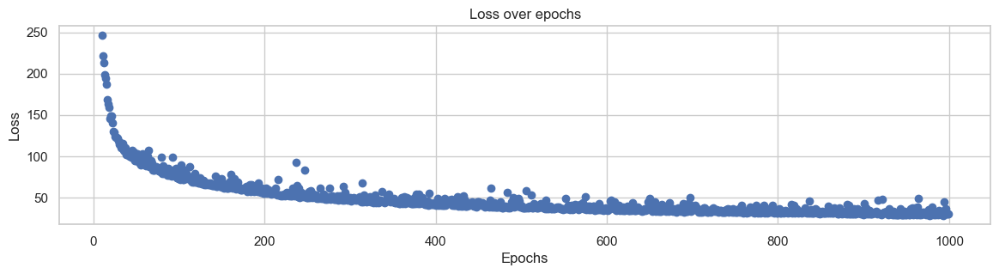

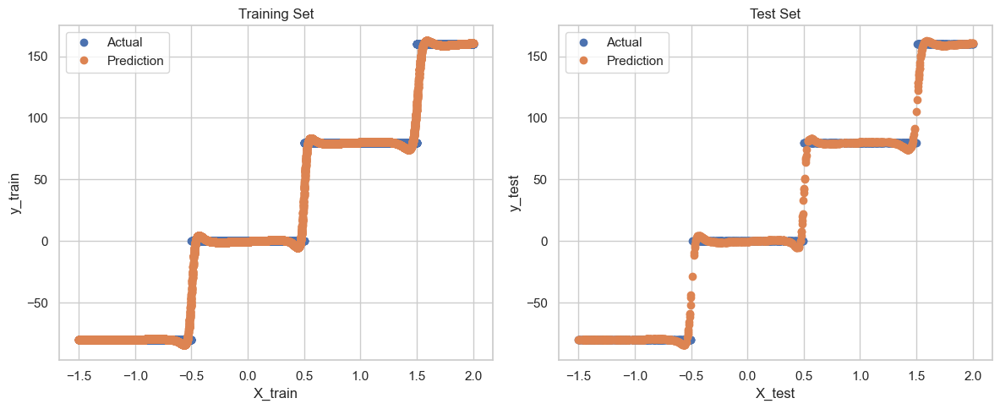

TRAIN MSE = 30.1099779263
TEST MSE  = 30.2833867006
TRAINING TIME = 610.67 SECONDS






########################################################################################################################
############################## Training config: layers = [{'input_dim': 1, 'output_dim': 30, 'activation': 'sigmoid'}, {'input_dim': 30, 'output_dim': 30, 'activation': 'sigmoid'}, {'input_dim': 30, 'output_dim': 1, 'activation': 'linear'}]. ##############################

Epoch 1/1000. Loss = 6206.2024657900665.

Epoch 2/1000. Loss = 2257.34767937141.

Epoch 3/1000. Loss = 1440.8975123146995.

Epoch 4/1000. Loss = 1061.6004331592314.

Epoch 5/1000. Loss = 802.2386046354715.

Epoch 6/1000. Loss = 554.1686859938947.

Epoch 7/1000. Loss = 433.5311738196008.

Epoch 8/1000. Loss = 362.04199936907014.

Epoch 9/1000. Loss = 276.5458683021351.

Epoch 10/1000. Loss = 256.6212505143636.

Epoch 11/1000. Loss = 209.08140637567573.

Epoch 12/1000. Loss = 212.50772531626578.

Epoch 13/1000. L

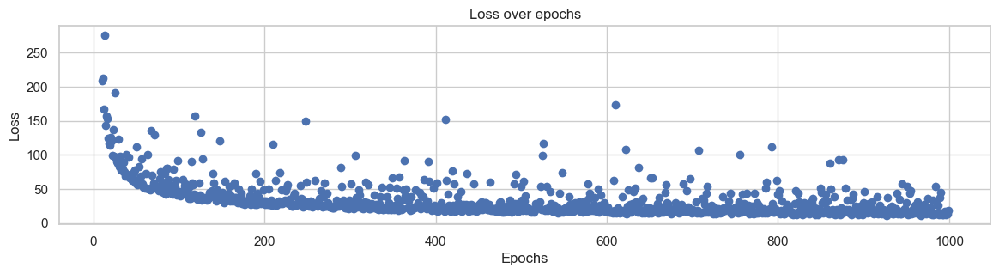

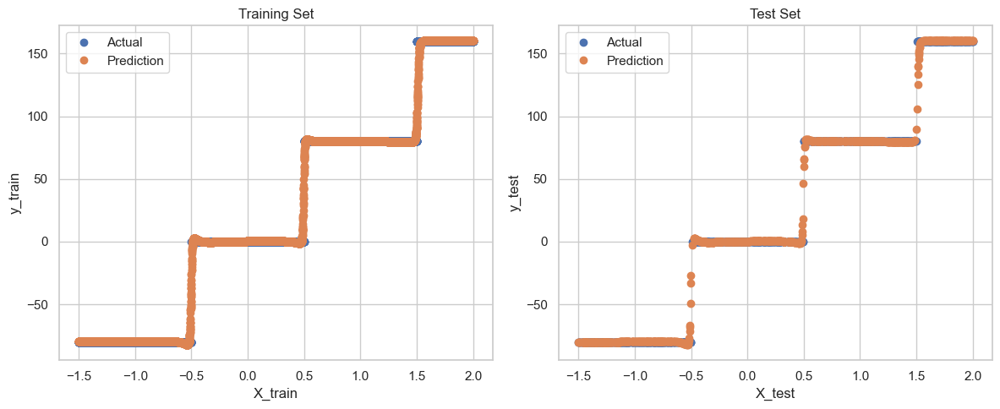

TRAIN MSE = 17.9301301471
TEST MSE  = 16.5232643677
TRAINING TIME = 610.67 SECONDS








In [64]:
np.random.seed(23)

steps_large_train = pd.read_csv('./data/regression/steps-large-training.csv')
steps_large_train.drop(steps_large_train.columns[0], axis = 1, inplace = True)

X_train = steps_large_train.iloc[:, 0:(len(steps_large_train.iloc[1]) - 1)]
y_train = np.array(steps_large_train['y'])

steps_large_test = pd.read_csv('./data/regression/steps-large-test.csv')
steps_large_test.drop(steps_large_test.columns[0], axis = 1, inplace = True)

X_test = steps_large_test.iloc[:, 0:(len(steps_large_test.iloc[1]) - 1)]
y_test = np.array(steps_large_test['y'])

best_layers = [
    [
        {'input_dim' : 1, 'output_dim' : 30, 'activation' : 'tanh'},
        {'input_dim' : 30, 'output_dim' : 1, 'activation' : 'linear'}  
    ],
    [
        {'input_dim' : 1, 'output_dim' : 30, 'activation' : 'sigmoid'},
        {'input_dim' : 30, 'output_dim' : 30, 'activation' : 'sigmoid'},
        {'input_dim' : 30, 'output_dim' : 1, 'activation' : 'linear'}  
    ]
]

for layers in best_layers:
    print("#" * 120)
    print(f"############################## Training config: layers = {layers}. ##############################")

    NN = MLP(
        layers=layers,
        weights_init='uniform',
        classification=False
    )
    
    
    NN.train(X_train, y_train, epochs=1000, learning_rate=0.005, batch_size=120)

    y_train_pred = NN.predict(X_train)
    y_test_pred = NN.predict(X_test)

    train_mse = NN.mse(y_train_pred, y_train)
    test_mse = NN.mse(y_test_pred, y_test)
    create_plots(X_train, y_train, X_test, y_test, y_train_pred, y_test_pred)
    print(f"TRAIN MSE = {train_mse:.10f}")
    print(f"TEST MSE  = {test_mse:.10f}")
    print(f"TRAINING TIME = {training_time:.2f} SECONDS")
    
    print('\n' * 5)

## **rings3-regular dataset**

########################################################################################################################
############################## Training config: layers = [{'input_dim': 2, 'output_dim': 30, 'activation': 'tanh'}, {'input_dim': 30, 'output_dim': 3, 'activation': 'softmax'}]. ##############################

Epoch 1/10000. Loss = 1.4753896822910866. F1 Score = 0.3086345637284695.

Epoch 2/10000. Loss = 1.4304985970812631. F1 Score = 0.3107473536895895.

Epoch 3/10000. Loss = 1.3907057048448812. F1 Score = 0.30892623050158813.

Epoch 4/10000. Loss = 1.3558256927092882. F1 Score = 0.30539536664338335.

Epoch 5/10000. Loss = 1.32399788682945. F1 Score = 0.3066355532231482.

Epoch 6/10000. Loss = 1.2949921016613566. F1 Score = 0.306085873046629.

Epoch 7/10000. Loss = 1.2675603943589477. F1 Score = 0.31008519458115086.

Epoch 8/10000. Loss = 1.24104118823591. F1 Score = 0.31002398135852777.

Epoch 9/10000. Loss = 1.2191451544763576. F1 Score = 0.38804315147031215.

Epo

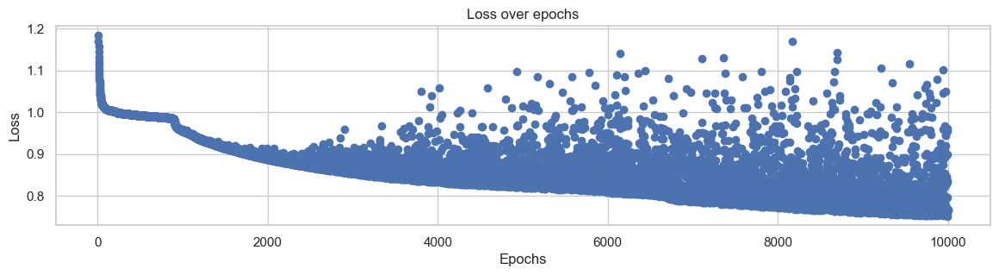

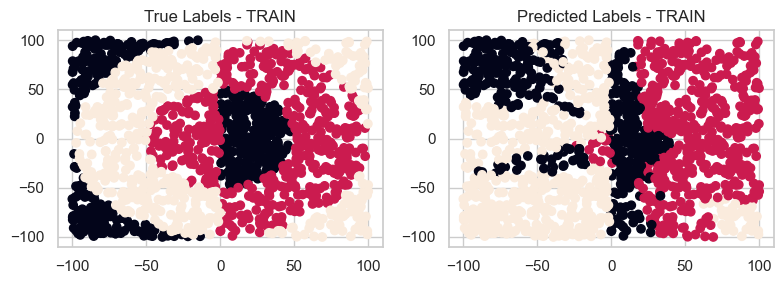

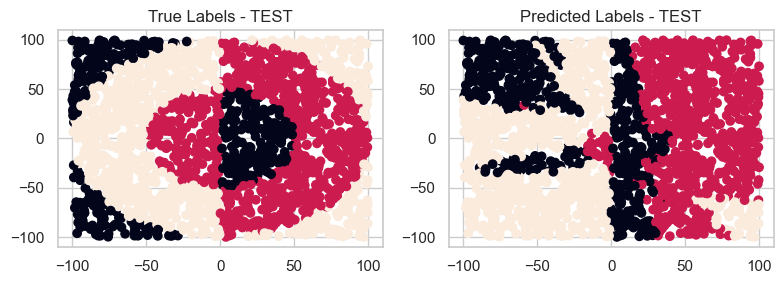

TRAIN F1 SCORE = 0.6149252729
TEST F1 SCORE  = 0.6091709890
TRAINING TIME = 192.68 SECONDS






########################################################################################################################
############################## Training config: layers = [{'input_dim': 2, 'output_dim': 30, 'activation': 'sigmoid'}, {'input_dim': 30, 'output_dim': 30, 'activation': 'sigmoid'}, {'input_dim': 30, 'output_dim': 3, 'activation': 'softmax'}]. ##############################

Epoch 1/10000. Loss = 2.117633616097887. F1 Score = 0.16666666666666666.

Epoch 2/10000. Loss = 2.0432033754448455. F1 Score = 0.16666666666666666.

Epoch 3/10000. Loss = 1.9748934302256596. F1 Score = 0.16666666666666666.

Epoch 4/10000. Loss = 1.9132598331362776. F1 Score = 0.16666666666666666.

Epoch 5/10000. Loss = 1.8568284101868273. F1 Score = 0.16666666666666666.

Epoch 6/10000. Loss = 1.8045375388733422. F1 Score = 0.16666666666666666.

Epoch 7/10000. Loss = 1.7560297715356228. F1 Score = 0.166

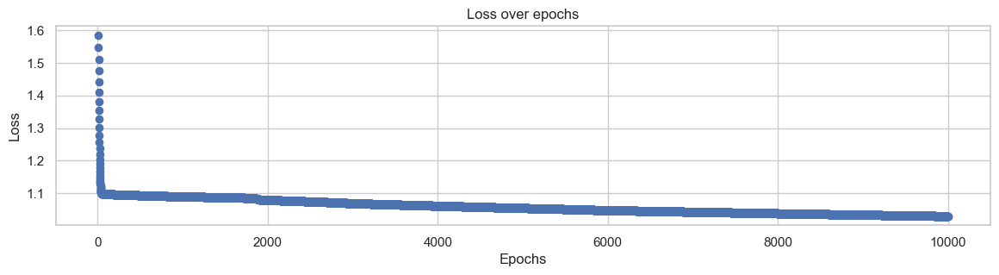

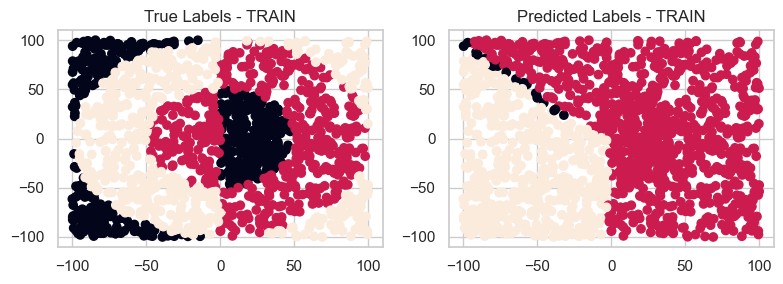

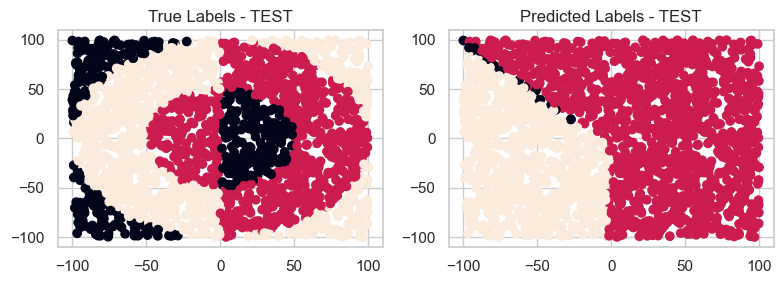

TRAIN F1 SCORE = 0.3710399090
TEST F1 SCORE  = 0.4187611938
TRAINING TIME = 227.39 SECONDS








In [56]:
np.random.seed(23)

rings3_regular_train = pd.read_csv('./data/classification/rings3-regular-training.csv')

X_train = rings3_regular_train.iloc[:, 0:(len(rings3_regular_train.iloc[1]) - 1)]
y_train = np.array(rings3_regular_train.iloc[:,-1])

rings3_regular_test = pd.read_csv('./data/classification/rings3-regular-test.csv')

X_test = rings3_regular_test.iloc[:, 0:(len(rings3_regular_test.iloc[1]) - 1)]
y_test = np.array(rings3_regular_test['c'])

best_layers = [
    [
        {'input_dim' : 2, 'output_dim' : 30, 'activation' : 'tanh'},
        {'input_dim' : 30, 'output_dim' : 3, 'activation' : 'softmax'}  
    ],
    [
        {'input_dim' : 2, 'output_dim' : 30, 'activation' : 'sigmoid'},
        {'input_dim' : 30, 'output_dim' : 30, 'activation' : 'sigmoid'},
        {'input_dim' : 30, 'output_dim' : 3, 'activation' : 'softmax'}  
    ]
]

for layers in best_layers:
    print("#" * 120)
    print(f"############################## Training config: layers = {layers}. ##############################")

    NN = MLP(
        layers=layers,
        weights_init='uniform',
        classification=True
    )
    
    start_time = time.time()
    NN.train(X_train, y_train, epochs=10000, learning_rate=0.001, batch_size=120)
    end_time = time.time()
    training_time = end_time - start_time
    
    y_train_pred = NN.predict(X_train)
    y_test_pred = NN.predict(X_test)

    train_mse = NN.f1_score(y_train_pred, y_train)
    test_mse = NN.f1_score(y_test_pred, y_test)
    create_plots(X_train, y_train, X_test, y_test, y_train_pred, y_test_pred, classification=True)
    print(f"TRAIN F1 SCORE = {train_mse:.10f}")
    print(f"TEST F1 SCORE  = {test_mse:.10f}")
    print(f"TRAINING TIME = {training_time:.2f} SECONDS")
    
    print('\n' * 5)

## **rings5-regular dataset**

########################################################################################################################
############################## Training config: layers = [{'input_dim': 2, 'output_dim': 30, 'activation': 'tanh'}, {'input_dim': 30, 'output_dim': 5, 'activation': 'softmax'}]. ##############################

Epoch 1/10000. Loss = 2.459031354659246. F1 Score = 0.13412617074601332.

Epoch 2/10000. Loss = 2.2134420166954447. F1 Score = 0.1435584712502765.

Epoch 3/10000. Loss = 1.9993349882631126. F1 Score = 0.20371129456521803.

Epoch 4/10000. Loss = 1.8544793979322887. F1 Score = 0.24765034995043997.

Epoch 5/10000. Loss = 1.7431305887055453. F1 Score = 0.28794468160405745.

Epoch 6/10000. Loss = 1.6569634214071947. F1 Score = 0.30503042670296887.

Epoch 7/10000. Loss = 1.5876858526065596. F1 Score = 0.3186970046843499.

Epoch 8/10000. Loss = 1.5330316502840102. F1 Score = 0.32750809257494246.

Epoch 9/10000. Loss = 1.4867131023110263. F1 Score = 0.3149047288719661.

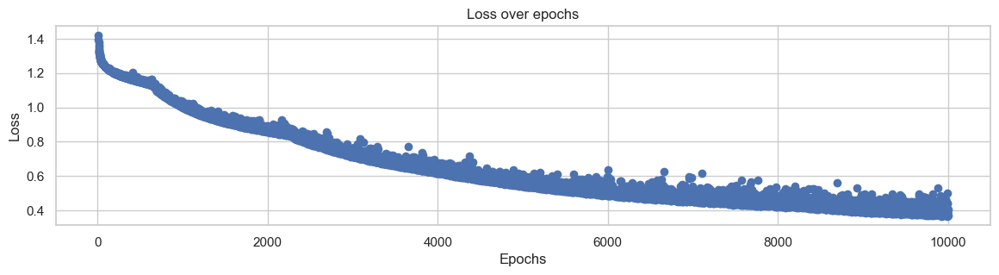

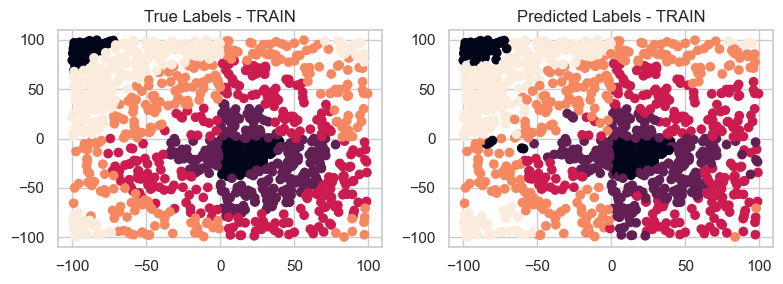

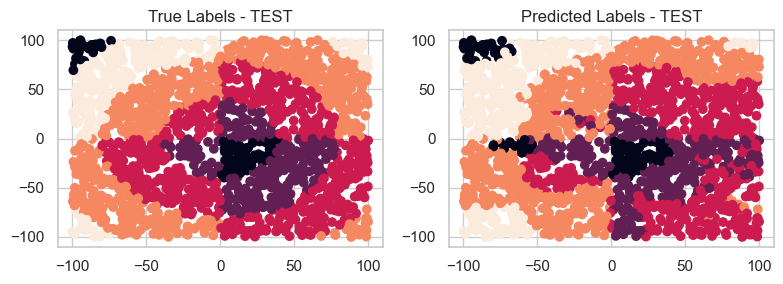

TRAIN F1 SCORE = 0.8472146167
TEST F1 SCORE  = 0.7512505846
TRAINING TIME = 474.32 SECONDS






########################################################################################################################
############################## Training config: layers = [{'input_dim': 2, 'output_dim': 30, 'activation': 'sigmoid'}, {'input_dim': 30, 'output_dim': 30, 'activation': 'sigmoid'}, {'input_dim': 30, 'output_dim': 5, 'activation': 'softmax'}]. ##############################

Epoch 1/10000. Loss = 2.6906329605312034. F1 Score = 0.06666666666666668.

Epoch 2/10000. Loss = 2.453562336165987. F1 Score = 0.06666666666666668.

Epoch 3/10000. Loss = 2.274181204998798. F1 Score = 0.08330850854147487.

Epoch 4/10000. Loss = 2.1219242529271223. F1 Score = 0.09602219376867263.

Epoch 5/10000. Loss = 1.9910006397017936. F1 Score = 0.09654133787198929.

Epoch 6/10000. Loss = 1.882303740025781. F1 Score = 0.10737134139781102.

Epoch 7/10000. Loss = 1.7980815253030997. F1 Score = 0.11115

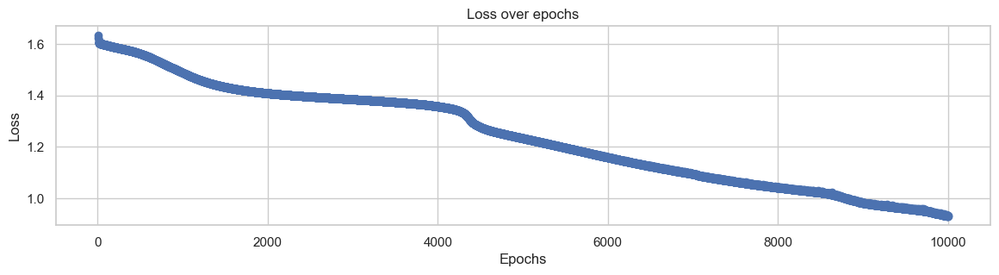

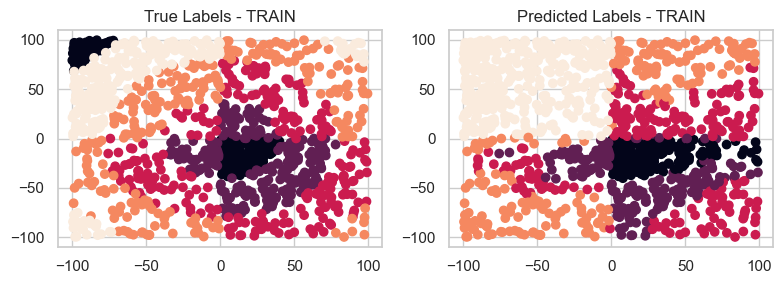

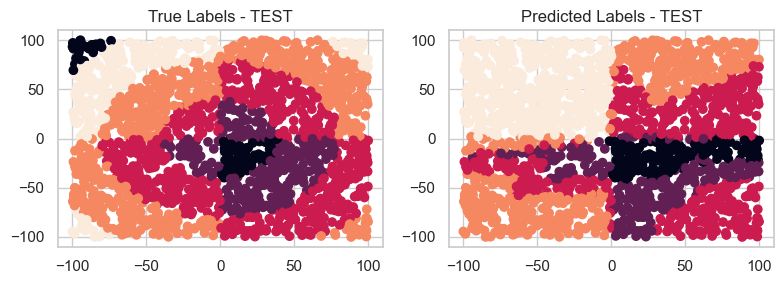

TRAIN F1 SCORE = 0.6275549349
TEST F1 SCORE  = 0.5405297975
TRAINING TIME = 610.67 SECONDS








In [61]:
np.random.seed(23)

rings5_regular_train = pd.read_csv('./data/classification/rings5-regular-training.csv')

X_train = rings5_regular_train.iloc[:, 0:(len(rings5_regular_train.iloc[1]) - 1)]
y_train = np.array(rings5_regular_train.iloc[:,-1])

rings5_regular_test = pd.read_csv('./data/classification/rings5-regular-test.csv')

X_test = rings5_regular_test.iloc[:, 0:(len(rings5_regular_test.iloc[1]) - 1)]
y_test = np.array(rings5_regular_test['c'])

best_layers = [
    [
        {'input_dim' : 2, 'output_dim' : 30, 'activation' : 'tanh'},
        {'input_dim' : 30, 'output_dim' : 5, 'activation' : 'softmax'}  
    ],
    [
        {'input_dim' : 2, 'output_dim' : 30, 'activation' : 'sigmoid'},
        {'input_dim' : 30, 'output_dim' : 30, 'activation' : 'sigmoid'},
        {'input_dim' : 30, 'output_dim' : 5, 'activation' : 'softmax'}  
    ]
]

for layers in best_layers:
    print("#" * 120)
    print(f"############################## Training config: layers = {layers}. ##############################")

    NN = MLP(
        layers=layers,
        weights_init='uniform',
        classification=True
    )
    
    start_time = time.time()
    NN.train(X_train, y_train, epochs=10000, learning_rate=0.0001, batch_size=20, optimizer='momentum')
    end_time = time.time()
    training_time = end_time - start_time
    
    y_train_pred = NN.predict(X_train)
    y_test_pred = NN.predict(X_test)

    train_mse = NN.f1_score(y_train_pred, y_train)
    test_mse = NN.f1_score(y_test_pred, y_test)
    create_plots(X_train, y_train, X_test, y_test, y_train_pred, y_test_pred, classification=True)
    print(f"TRAIN F1 SCORE = {train_mse:.10f}")
    print(f"TEST F1 SCORE  = {test_mse:.10f}")
    print(f"TRAINING TIME = {training_time:.2f} SECONDS")
    
    print('\n' * 5)

## **Conclusions:**
Both architectures handled the regression task well, but as we can see, they did not perform well on the classification task. Between the two, tanh performed better.